# [tensorboard](http://20.80.43.232:8085)
* [command](https://github.com/tensorflow/tensorflow/issues/1548)
* tensorboard --port=8085 --bind_all --logdir /home/tj/notebooks/coffeebeans/tensorboardlogs

In [1]:
import os, copy, cv2, dask, glob, re, importlib, datetime, math, random, itertools
import pandas as pd
import numpy as np
import dask.array
from IPython.display import display
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_addons as tfa
import importlib.util
from sklearn.model_selection import train_test_split
from functools import reduce
import official.nlp.optimization

%load_ext tensorboard
%matplotlib inline

overall_workingdir = '/home/tj/notebooks/coffeebeans'
spec = importlib.util.spec_from_file_location("commonsettings", os.path.join(overall_workingdir,'commonsettings.py'))
commonsettings = importlib.util.module_from_spec(spec)        
spec.loader.exec_module(commonsettings)

spec2 = importlib.util.spec_from_file_location("circle_loss", os.path.join(overall_workingdir,'circle_loss.py'))
circle_loss = importlib.util.module_from_spec(spec2)        
spec2.loader.exec_module(circle_loss)

modelSavePath = '/opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/tj/'
tensorboardLogsPath = os.path.join(overall_workingdir,'tensorboardlogs')

In [2]:
homeDir = os.getcwd()
coffeebeansDir = overall_workingdir #os.path.join(homeDir, 'coffeebeans')
overall_darknetdir = os.path.join(overall_workingdir,'darknet')
overall_traindataSrcPathBase = os.path.join(overall_darknetdir,'data')

baseConfigFilenames = commonsettings.generatePaths(
    targetOssep="/",
    traindataSrcPathBase = overall_traindataSrcPathBase,
    traindataSrcPathBaseDisplayed = overall_traindataSrcPathBase,
    specificProjName = 'purebeans_tiny_filtered_w1120h1120_20210531'
)

In [3]:
rawSrcAnnotations = commonsettings.getLabelStudioData()
rawSrcAnnotations = commonsettings.rawSrcAnnotationsToPdDF(rawSrcAnnotations)
rawSrcAnnotations = rawSrcAnnotations[rawSrcAnnotations['created_username'].str.contains("tingjhenjiang")]

In [4]:
newRawSrcAnnotations = copy.deepcopy(rawSrcAnnotations)
#newRawSrcAnnotations = newRawSrcAnnotations.reset_index(drop=True)
newRawSrcAnnotations = newRawSrcAnnotations[newRawSrcAnnotations['created_username'].str.contains('tingjhenjiang')]
newRawSrcAnnotations['imagesStoredPaths'] = newRawSrcAnnotations['data.image.basename'].apply(lambda x: os.path.join(baseConfigFilenames['traindataSrcPathImgsBase'], x) )
newRawSrcAnnotations['value.orig.left'] = newRawSrcAnnotations['original_width'] * newRawSrcAnnotations['value.x'] / 100
newRawSrcAnnotations['value.orig.top'] = newRawSrcAnnotations['original_height'] * newRawSrcAnnotations['value.y'] / 100
newRawSrcAnnotations['value.orig.width'] = newRawSrcAnnotations['original_width'] * newRawSrcAnnotations['value.width'] / 100
newRawSrcAnnotations['value.orig.height'] = newRawSrcAnnotations['original_height'] * newRawSrcAnnotations['value.height'] / 100
newRawSrcAnnotations['value.orig.right'] = newRawSrcAnnotations['value.orig.width'] + newRawSrcAnnotations['value.orig.left']
newRawSrcAnnotations['value.orig.bottom'] = newRawSrcAnnotations['value.orig.height'] + newRawSrcAnnotations['value.orig.top']
anotationMaxWidth = round(newRawSrcAnnotations['value.orig.width'].max())
anotationMaxHeight = round(newRawSrcAnnotations['value.orig.height'].max())
targetAnotationMaxWidth = round(anotationMaxWidth*0.65)
targetAnotationMaxHeight = round(anotationMaxHeight*0.65)
labelDict = newRawSrcAnnotations['value.rectanglelabels'].tolist()
labelDict = sorted(list(set(reduce(lambda x, y: x+y, labelDict) )))
labelDict = {v:key for key,v in enumerate(labelDict)}
yLabelsPrefixes = {label:'value.y.'+label for label, labelNum in labelDict.items()}
newRawSrcAnnotations = newRawSrcAnnotations.reset_index(drop=True)
for label, yLabelsPrefix in yLabelsPrefixes.items():
    newRawSrcAnnotations[yLabelsPrefix] = newRawSrcAnnotations['value.rectanglelabels'].apply(lambda x: 1 if label in x else 0)
#df.columns.values.tolist()
newRawSrcAnnotations['trainlabels'] = pd.Series(newRawSrcAnnotations.loc[:, yLabelsPrefixes.values()].values.tolist()) # newRawSrcAnnotations.columns.str.startswith('value.y.')

#把壞豆集中不需細分種類
badbeansLabels = ['Broken', 'Dead', 'ForeignMatter', 'Hulls', 'Immature', 'Insect', 'Moldy', 'MottledSpotted', 'Oldpast', 'Pureblack', 'Shells', 'Sour', 'Unhulled', 'Withered']
badbeansLabelCols = [column for column in newRawSrcAnnotations.columns for badbeansLabel in badbeansLabels if column.find(badbeansLabel)!=-1]
belongsToBad = newRawSrcAnnotations.loc[:,badbeansLabelCols].values.tolist()
for key,res in enumerate(belongsToBad):
    belongsToBad[key] = 1 if 1 in res else 0
newRawSrcAnnotations['value.y.belongsToBad'] = pd.Series(belongsToBad)
badCondensedTrainlabels = ['value.y.Good','value.y.UnlabelledBean','value.y.belongsToBad']
newRawSrcAnnotations['badCondensedTrainlabels'] = pd.Series(newRawSrcAnnotations.loc[:, badCondensedTrainlabels].values.tolist())

print(newRawSrcAnnotations.columns)
display(newRawSrcAnnotations, anotationMaxWidth, anotationMaxHeight)
pd.set_option('display.max_columns', None)
display(newRawSrcAnnotations[newRawSrcAnnotations['value.orig.width']==anotationMaxWidth])

Index(['task', 'task_created_at', 'task_updated_at', 'is_labeled', 'overlap',
       'project', 'file_upload', 'data.image', 'annotation_from_an_author_id',
       'created_username', 'created_ago', 'completed_by', 'was_cancelled',
       'ground_truth', 'annotation_from_an_author_updated_at',
       'annotation_from_an_author_updated_at', 'lead_time', 'original_width',
       'original_height', 'image_rotation', 'annotation_id', 'from_name',
       'to_name', 'type', 'value.x', 'value.y', 'value.width', 'value.height',
       'value.rotation', 'value.rectanglelabels', 'meta.text',
       'value.yolo.width', 'value.yolo.height', 'value.yolo.x.center',
       'value.yolo.y.center', 'data.image.basename', 'imagesStoredPaths',
       'value.orig.left', 'value.orig.top', 'value.orig.width',
       'value.orig.height', 'value.orig.right', 'value.orig.bottom',
       'value.y.Broken', 'value.y.Dead', 'value.y.ForeignMatter',
       'value.y.Good', 'value.y.Hulls', 'value.y.Immature', 'value.

,task,task_created_at,task_updated_at,is_labeled,overlap,project,file_upload,data.image,annotation_from_an_author_id,created_username,...,value.y.Oldpast,value.y.Pureblack,value.y.Shells,value.y.Sour,value.y.Unhulled,value.y.UnlabelledBean,value.y.Withered,trainlabels,value.y.belongsToBad,badCondensedTrainlabels
0,301,2021-05-01T13:33:03.621487Z,2021-06-10T05:14:09.644420Z,True,1,2,30,http://192.168.10.200/coffeebeans/images/good-...,847,"tingjhenjiang@gmail.com, 2",...,0,0,0,0,0,1,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]",0,"[0, 1, 0]"
1,301,2021-05-01T13:33:03.621487Z,2021-06-10T05:14:09.644420Z,True,1,2,30,http://192.168.10.200/coffeebeans/images/good-...,847,"tingjhenjiang@gmail.com, 2",...,0,0,0,0,0,1,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]",0,"[0, 1, 0]"
2,301,2021-05-01T13:33:03.621487Z,2021-06-10T05:14:09.644420Z,True,1,2,30,http://192.168.10.200/coffeebeans/images/good-...,847,"tingjhenjiang@gmail.com, 2",...,0,0,0,0,0,1,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]",0,"[0, 1, 0]"
3,301,2021-05-01T13:33:03.621487Z,2021-06-10T05:14:09.644420Z,True,1,2,30,http://192.168.10.200/coffeebeans/images/good-...,847,"tingjhenjiang@gmail.com, 2",...,0,0,0,0,0,0,0,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",0,"[1, 0, 0]"
4,301,2021-05-01T13:33:03.621487Z,2021-06-10T05:14:09.644420Z,True,1,2,30,http://192.168.10.200/coffeebeans/images/good-...,847,"tingjhenjiang@gmail.com, 2",...,0,0,0,0,0,0,0,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",0,"[1, 0, 0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7731,129,2021-05-01T13:33:03.578304Z,2021-05-24T03:03:32.660496Z,True,1,2,30,http://192.168.10.200/coffeebeans/images/bad-I...,639,"tingjhenjiang@gmail.com, 2",...,0,0,0,0,0,0,0,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",1,"[0, 0, 1]"
7732,129,2021-05-01T13:33:03.578304Z,2021-05-24T03:03:32.660496Z,True,1,2,30,http://192.168.10.200/coffeebeans/images/bad-I...,639,"tingjhenjiang@gmail.com, 2",...,0,0,0,0,0,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]",1,"[0, 0, 1]"
7733,129,2021-05-01T13:33:03.578304Z,2021-05-24T03:03:32.660496Z,True,1,2,30,http://192.168.10.200/coffeebeans/images/bad-I...,639,"tingjhenjiang@gmail.com, 2",...,0,0,0,0,0,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]",1,"[0, 0, 1]"
7734,129,2021-05-01T13:33:03.578304Z,2021-05-24T03:03:32.660496Z,True,1,2,30,http://192.168.10.200/coffeebeans/images/bad-I...,639,"tingjhenjiang@gmail.com, 2",...,0,0,0,0,1,0,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]",1,"[0, 0, 1]"


500

460

,task,task_created_at,task_updated_at,is_labeled,overlap,project,file_upload,data.image,annotation_from_an_author_id,created_username,created_ago,completed_by,was_cancelled,ground_truth,annotation_from_an_author_updated_at,annotation_from_an_author_updated_at,lead_time,original_width,original_height,image_rotation,annotation_id,from_name,to_name,type,value.x,value.y,value.width,value.height,value.rotation,value.rectanglelabels,meta.text,value.yolo.width,value.yolo.height,value.yolo.x.center,value.yolo.y.center,data.image.basename,imagesStoredPaths,value.orig.left,value.orig.top,value.orig.width,value.orig.height,value.orig.right,value.orig.bottom,value.y.Broken,value.y.Dead,value.y.ForeignMatter,value.y.Good,value.y.Hulls,value.y.Immature,value.y.Insect,value.y.Moldy,value.y.MottledSpotted,value.y.Oldpast,value.y.Pureblack,value.y.Shells,value.y.Sour,value.y.Unhulled,value.y.UnlabelledBean,value.y.Withered,trainlabels,value.y.belongsToBad,badCondensedTrainlabels


In [5]:
def padAndpasteImage(image, targetHeight=targetAnotationMaxHeight, targetWidth=targetAnotationMaxWidth): #, borderW, borderH
    borderW = (targetWidth - image.shape[1])/2
    borderH = (targetHeight - image.shape[0])/2
    borderColor = [255, 255, 255]
    if ((borderW/1) - (borderW//1))!=0: #有小數殘餘
        left, right = borderW+0.5, borderW-0.5
    else:
        left, right = borderW, borderW
    if ((borderH/1) - (borderH//1))!=0: #有小數殘餘
        top, bottom = borderH+0.5, borderH-0.5
    else:
        top, bottom = borderH, borderH
    left, right, top, bottom = map(int, [left, right, top, bottom])
    #print([left, right, top, bottom])
    imgWithBorder = cv2.copyMakeBorder(image, top, bottom, left, right, cv2.BORDER_CONSTANT, value=borderColor)
    return imgWithBorder
def customCropImg(srcimg, x, y, w, h):
    return srcimg[y:y+h, x:x+w]
def maintainRatioResize(image, width = None, height = None, inter = cv2.INTER_AREA):
    # initialize the dimensions of the image to be resized and
    # grab the image size
    dim = None
    (h, w) = image.shape[:2]
    # if both the width and height are None, then return the
    # original image
    if width is None and height is None:
        return image
    # check to see if the width is None
    if width is None:
        # calculate the ratio of the height and construct the
        # dimensions
        r = height / float(h)
        dim = (int(w * r), height)
    # otherwise, the height is None
    else:
        # calculate the ratio of the width and construct the
        # dimensions
        r = width / float(w)
        dim = (width, int(h * r))
    # resize the image
    resized = cv2.resize(image, dim, interpolation = inter)
    # return the resized image
    return resized
def resizeToFitLargeDim(image, targetHeight=targetAnotationMaxHeight, targetWidth=targetAnotationMaxWidth):
    needToResize = (image.shape[0]>targetHeight or image.shape[1]>targetWidth)
    if needToResize:
        estResizeRatioW, estResizeRatioH = [image.shape[1]/targetWidth, image.shape[0]/targetHeight]
        resizeRatioDict = {str(estResizeRatioW):'W',str(estResizeRatioH):'H'}
        maxEstResizeRatio = max([estResizeRatioW, estResizeRatioH])
        resizeBasisOn = resizeRatioDict[str(maxEstResizeRatio)]
        return maintainRatioResize(image, width=targetWidth) if resizeBasisOn=='W' else maintainRatioResize(image, height=targetHeight)
    else:
        return image

#print(anotationMaxWidth, anotationMaxHeight)
stashedImages = []
imgLabels = []
imgTraceBackInf = []
n = 0
for f in newRawSrcAnnotations['imagesStoredPaths'].unique():
    cropImageDf = newRawSrcAnnotations[newRawSrcAnnotations['imagesStoredPaths']==f].reset_index(drop=True)

    #multi-label classification
    #label = cropImageDf['trainlabels'].tolist() #
    label = cropImageDf['badCondensedTrainlabels'].tolist()
    imgLabels.extend(label)
        
    #multi-class classification
    #label = cropImageDf.iloc['trainlabels']
    #imgLabels.append(label)
    
    # 讀取圖檔
    #img = dask.delayed(cv2.imread)(f)
    img = cv2.imread(f)
    for i in range(len(cropImageDf.index)):
        x = round(cropImageDf.iloc[i,:]['value.orig.left'])
        y = round(cropImageDf.iloc[i,:]['value.orig.top'])
        w = round(cropImageDf.iloc[i,:]['value.orig.width'])
        h = round(cropImageDf.iloc[i,:]['value.orig.height'])
        #print("i at x y w h: {}, {}, {}, {}".format(i,x,y,w,h))
        task = cropImageDf.iloc[i,:]['task']
        if True:
            imgTraceBackInf.append({
                'index':"{}_annotation{}.jpg".format(f,i),
                'task':task,
                'annotation_i': i,
                'attr':[cropImageDf.iloc[i,:]['value.x'],cropImageDf.iloc[i,:]['value.y'],cropImageDf.iloc[i,:]['value.width'],cropImageDf.iloc[i,:]['value.height']]
            })
        
        cropImg = dask.delayed(customCropImg)(img, x, y, w, h)
        resizedImg = dask.delayed(resizeToFitLargeDim)(cropImg, targetHeight=targetAnotationMaxHeight, targetWidth=targetAnotationMaxWidth)
        #borderWidthPred = (anotationMaxWidth - w)/2
        #borderHeightPred = (anotationMaxHeight - h)/2
        #anotationMaxHeight, anotationMaxWidth
        #borderWidthPred, borderHeightPred
        paddedImg = dask.delayed(padAndpasteImage)(resizedImg, targetHeight=targetAnotationMaxHeight, targetWidth=targetAnotationMaxWidth)
        rgbImg = dask.delayed(cv2.cvtColor)(paddedImg, cv2.COLOR_BGR2RGB)
        #print("borderWidthPred is {} borderHeightPred is {}".format(borderWidthPred,borderHeightPred))
        stashedImages.append(
            rgbImg
        )
        #break
        if False:
            print("task {} annotation {} lable is {} borderWidthPred is {} borderHeightPred is {}".format(
                task,i,label,borderWidthPred,borderHeightPred)
                 )
            commonsettings.imShow(paddedImage)
    #break
#print(stashedImages)

In [6]:
num_workers = 160
scheduler = 'threads'
seed=24
testSize = 0.25
batch_size = 32
epochs=120
num_classes = len(labelDict)
num_classes = len(badCondensedTrainlabels)
origStashImagesLen = len(stashedImages)

imputatedNs = []
while ((len(stashedImages)/batch_size - len(stashedImages)//batch_size)!=0) or ((len(stashedImages)*(1-testSize)/batch_size - len(stashedImages)*(1-testSize)//batch_size)!=0):
    imputated_n = random.choice(range(origStashImagesLen))
    imputatedNs.append(imputated_n)
    stashedImages.append( stashedImages[imputated_n] )
    imgLabels.append( imgLabels[imputated_n] )

random.seed(a=seed, version=2)
randomlySampled_i = random.sample(range(len(stashedImages)), len(stashedImages) )
sampleTrain_i, sampleVal_i = train_test_split(randomlySampled_i, test_size=testSize, random_state=seed)

#stashedImages = [stashedImages[i] for i in randomlySampled_i]
#imgLabels = [imgLabels[i] for i in randomlySampled_i]
    
#Y_all = np.array([labelDict[l] for l in imgLabels]) #multi-class classification
Y_all = np.array(imgLabels).astype(float) #multi-label classification
X_all = [dask.array.from_delayed(X, dtype=np.float64, shape=(targetAnotationMaxHeight, targetAnotationMaxWidth, 3) ) for X in stashedImages]
X_all = dask.array.stack(X_all, axis=0)
#X_all_computed = np.array(dask.compute(*X_all, num_workers=num_workers, scheduler=scheduler))
#X_all[0:1000,:,:].compute(num_workers=num_workers, scheduler=scheduler).shape
#dataset = tf.data.Dataset.from_generator(custom_generator).batch(batch_size)

case_nums = X_all.shape[0]
trainsetnums = int(case_nums*(1-testSize))
validationsetnums = case_nums-trainsetnums

In [7]:
from tensorflow.keras.callbacks import TensorBoard
class LRTensorBoard(TensorBoard):
    def __init__(self, log_dir, **kwargs):  # add other arguments to __init__ if you need
        super().__init__(log_dir=log_dir, **kwargs)

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        logs.update({'lr': tf.keras.backend.get_value(self.model.optimizer.lr)})
        super().on_epoch_end(epoch, logs)

callbackEarlystopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", restore_best_weights=True, mode="min", patience=35)
callbackReducelr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', factor=0.2, patience=5, min_lr=1e-7)
def callbackModelcheckpoint_with_filepath(prefix):
    needFilePath = prefix+"-.epoch{epoch:03d}-val_loss{val_loss:.5f}-val_f1_score{val_f1_score:.2f}-val_AUC{val_AUC:.2f}-val_recall{val_recall:.2f}-val_precision{val_precision:.2f}-val_binary_accuracy{val_binary_accuracy:.2f}.hdf5"
    callbackModelcheckpoint = tf.keras.callbacks.ModelCheckpoint(
        filepath=needFilePath,
        monitor='val_loss',
        verbose=1,
        save_best_only=False,
        save_weights_only=False,
        mode='min',
        save_freq='epoch'
    )
    return callbackModelcheckpoint
#[callbackEarlystopping, callbackModelcheckpoint_with_filepath('inceptionv3')]
callbackTensorboard = LRTensorBoard(log_dir=tensorboardLogsPath) #tf.keras.callbacks.TensorBoard(log_dir=tensorboardLogsPath, histogram_freq=1)
tensorboardCommand = " --port=8085 --bind_all --logdir "+tensorboardLogsPath
print('tensorboard'+tensorboardCommand)

preferredLoss = tf.keras.losses.BinaryCrossentropy()
preferredLoss = tfa.losses.SigmoidFocalCrossEntropy()
preferredLoss = circle_loss.CircleLoss(batch_size=batch_size)
preferredMetrics = [
    tf.keras.metrics.BinaryAccuracy(name='binary_accuracy'),
    tf.keras.metrics.Recall(name='recall', thresholds=0.5),
    tf.keras.metrics.Precision(name='precision', thresholds=0.5),
    tfa.metrics.F1Score(num_classes=num_classes, average='micro', threshold=0.5, name='f1_score'),
    tf.keras.metrics.AUC(name='AUC', multi_label=True, num_labels=num_classes)
]
weightedMetrics = ['binary_accuracy','recall','precision','f1_score','AUC']
initial_learning_rate = 2e-2
warmup_steps_ratio=0.08

steps_per_epoch,num_train_steps,warmup_steps = commonsettings.calcSteps(case_nums=trainsetnums, batch_size=batch_size, epochs=epochs, warmup_steps_ratio=warmup_steps_ratio)
validation_steps = math.ceil(validationsetnums / batch_size)
print("observations {} traincases {} validationcases {} batch_size {} epochs {} steps_per_epoch {} num_train_steps {} warmup_steps {}".format(
    case_nums,trainsetnums,validationsetnums,batch_size,epochs,steps_per_epoch,num_train_steps,warmup_steps))

decay_schedule = tf.keras.optimizers.schedules.CosineDecayRestarts(
    initial_learning_rate=initial_learning_rate,
    first_decay_steps=epochs//1.75, #num_train_steps//4
    m_mul=0.5
    #end_learning_rate=0
)

warmup_schedule = official.nlp.optimization.WarmUp(initial_learning_rate=initial_learning_rate,
    decay_schedule_fn=decay_schedule,
    warmup_steps=epochs*warmup_steps_ratio) #warmup_steps
#warmup_schedule_for_epochs(src_steps, lr=2e-2):
#    return warmup_schedule(src_steps*batch_size)

callbackLRscheduler = tf.keras.callbacks.LearningRateScheduler(warmup_schedule, verbose=1)
#callbackLRscheduler = tf.keras.callbacks.LearningRateScheduler(decay_schedule, verbose=1)

optimizer = official.nlp.optimization.AdamWeightDecay(
    learning_rate=warmup_schedule,
    weight_decay_rate=0.01,
    epsilon=1e-6,
    exclude_from_weight_decay=['LayerNorm', 'layer_norm', 'bias'])

optimizer = tfa.optimizers.AdamW(
    weight_decay = 0.01,
    learning_rate = initial_learning_rate,
    beta_1 = 0.9,
    beta_2 = 0.999,
    epsilon = 1e-6,
    amsgrad = False,
    name = 'AdamW'
)

optimizer = tf.keras.optimizers.SGD(
    learning_rate=initial_learning_rate, momentum=0.01, nesterov=False, name='SGD'
)

#X_train, X_val, y_train, y_val = train_test_split(X_all, Y_all, test_size=testSize) #, stratify=Y_all

#multi-class classification
#y_train = tf.keras.utils.to_categorical(y_train)
#y_val = tf.keras.utils.to_categorical(y_val)

#def customGenerator(batch_features, batch_labels, batch_size): # Create empty arrays to contain batch of features and labels
#    while True:
#        for i in range(batch_size):
#            yield batch_features, batch_labels

#X_train = dask.compute(*X_train, num_workers=num_workers, scheduler=scheduler)
#X_val = dask.compute(*X_val, num_workers=num_workers, scheduler=scheduler)
#https://blog.dask.org/2019/06/20/load-image-data
if False:
    data_gen_args = dict(
        featurewise_center=True,
        featurewise_std_normalization=True,
        rotation_range=90,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.2,
        validation_split=testSize,
        horizontal_flip=True,
        vertical_flip=True,
        rescale = 1 / 255.,
    )
    data_gen_flow_args = dict(
        x=X_all_computed,
        y=Y_all,
        shuffle=True,
        seed=seed,
        batch_size=batch_size
        #target_size=(anotationMaxHeight,anotationMaxWidth),
        #color_mode='rgb',
        #interpolation='nearest',
    )

    datagen = tf.keras.preprocessing.image.ImageDataGenerator(**data_gen_args)
    trainDataGenFlow = datagen.flow( **{**data_gen_flow_args, **{'subset':'training'}}  )
    validationDataGenFlow = datagen.flow( **{**data_gen_flow_args, **{'subset':'validation'}}  )
    #trainGenerator = trainDatagen.flow(X_train, y_train, batch_size=batchSize)

tensorboard --port=8085 --bind_all --logdir /home/tj/notebooks/coffeebeans/tensorboardlogs
observations 7808 traincases 5856 validationcases 1952 batch_size 32 epochs 120 steps_per_epoch 183 num_train_steps 21960 warmup_steps 1757


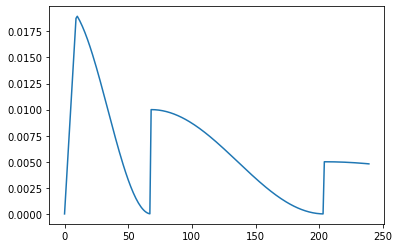

In [8]:
plt.plot([warmup_schedule(n) for n in range(epochs*2)])
#plt.plot([warmup_schedule_for_epochs(n/batch_size) for n in range(num_train_steps)])
plt.show()

In [9]:
from sklearn.utils import class_weight

differentWeightsBasisLabels = {"three":badCondensedTrainlabels,"sixteen":list(yLabelsPrefixes.values())}
badbeansLabelsCondensedRegExp = "("+"|".join(badbeansLabels)+")"
train_class_weights = {}
train_sample_weights = {}
for calcWeightBasisCols_key, calcWeightBasisCols in differentWeightsBasisLabels.items():
    calcWeightsDF = [
        newRawSrcAnnotations.loc[:,calcWeightBasisCols],
        newRawSrcAnnotations.loc[imputatedNs,calcWeightBasisCols]
    ]
    calcWeightsDF = pd.concat(calcWeightsDF).reset_index(drop=True)
    train_class_weights[calcWeightBasisCols_key] = [dict(zip(calcWeightsDF.loc[:,column].unique(),class_weight.compute_class_weight(
        class_weight='balanced',
        classes=calcWeightsDF.loc[:,column].unique(),
        y=calcWeightsDF.loc[:,column]
    ))) for column in calcWeightBasisCols]
    train_sample_weights[calcWeightBasisCols_key] = class_weight.compute_sample_weight(
        class_weight=train_class_weights[calcWeightBasisCols_key],
        y=calcWeightsDF.loc[:,calcWeightBasisCols].to_numpy()
    )
    display(calcWeightBasisCols)

display(train_class_weights)
display(train_sample_weights)
train_sample_weights = train_sample_weights['three']

if False:
    sumBadBeansClassWeights = {0:0,1:1}
    ratioAdjThreeToSixteenClassWeights = {}

    for i in [0,1]:
        sumBadBeansClassWeights[i] = [
            train_class_weight[i]
            for train_class_weight_key,train_class_weight in enumerate(train_class_weights["sixteen"])
            if re.search(badbeansLabelsCondensedRegExp,differentWeightsBasisLabels["sixteen"][train_class_weight_key])!=None
        ]
        sumBadBeansClassWeights[i] = reduce(lambda x,y: x+y, sumBadBeansClassWeights[i])
        ratioAdjThreeToSixteenClassWeights[i] = (sumBadBeansClassWeights[i]/train_class_weights['three'][badCondensedTrainlabels.index('value.y.belongsToBad')][i])

    #for train_class_weight_key,train_class_weight in enumerate(train_class_weights["sixteen"]):
    #    matchLabel = list(yLabelsPrefixes.values())[train_class_weight_key]
    #    if re.search(badbeansLabelsCondensedRegExp,matchLabel)!=None:
    #        sumBadBeansClassWeights[0] += train_class_weight[0]
    #        sumBadBeansClassWeights[1] += train_class_weight[1]
            #train_class_weights[train_class_weight_key][1] = train_class_weights[train_class_weight_key][1]/16*3 #16類整併為3類
            #pass
        #print(list(calcWeightBasisCols)[train_class_weight_key])
        #print(train_class_weights[train_class_weight_key])
    display(sumBadBeansClassWeights)
    display(ratioAdjThreeToSixteenClassWeights)


['value.y.Good', 'value.y.UnlabelledBean', 'value.y.belongsToBad']

['value.y.Broken',
 'value.y.Dead',
 'value.y.ForeignMatter',
 'value.y.Good',
 'value.y.Hulls',
 'value.y.Immature',
 'value.y.Insect',
 'value.y.Moldy',
 'value.y.MottledSpotted',
 'value.y.Oldpast',
 'value.y.Pureblack',
 'value.y.Shells',
 'value.y.Sour',
 'value.y.Unhulled',
 'value.y.UnlabelledBean',
 'value.y.Withered']

{'three': [{0: 0.6259419592752926, 1: 2.4850413749204328},
  {1: 1.377558221594919, 0: 0.7848813831926015},
  {0: 0.9068524970963996, 1: 1.1144733085926348}],
 'sixteen': [{0: 0.5164704325969044, 1: 15.67871485943775},
  {0: 0.5133464825772518, 1: 19.23152709359606},
  {0: 0.5002562788313686, 1: 976.0},
  {0: 0.6259419592752926, 1: 2.4850413749204328},
  {0: 0.5026393717007853, 1: 95.21951219512195},
  {0: 0.503287353358257, 1: 76.54901960784314},
  {0: 0.5075403016120645, 1: 33.6551724137931},
  {0: 0.5027040947720834, 1: 92.95238095238095},
  {0: 0.5135490660352539, 1: 18.95145631067961},
  {0: 0.5008338678640154, 1: 300.3076923076923},
  {0: 0.5671121441022661, 1: 4.225108225108225},
  {0: 0.5197018104366348, 1: 13.18918918918919},
  {0: 0.661134631668078, 1: 2.051497635312664},
  {0: 0.5012840267077555, 1: 195.2},
  {1: 1.377558221594919, 0: 0.7848813831926015},
  {0: 0.5076723016905071, 1: 33.08474576271186}]}

{'three': array([0.78195306, 0.78195306, 0.78195306, ..., 1.76878198, 0.78195306,
        0.78195306]),
 'sixteen': array([9.41464960e-05, 9.41464960e-05, 9.41464960e-05, ...,
        2.12959876e-04, 9.41464960e-05, 9.41464960e-05])}

In [16]:
#Y_all = np.array(imgLabels) #multi-label classification
#X_all = [dask.array.from_delayed(X, dtype=np.float64, shape=(anotationMaxHeight, anotationMaxWidth, 3) ) for X in stashedImages]
#X_all = dask.array.stack(X_all, axis=0)
import tensorflow.experimental.numpy as tnp
tnp.experimental_enable_numpy_behavior()

X_train = X_all[sampleTrain_i,:,:]
X_val = X_all[sampleVal_i,:,:]
Y_train = Y_all[sampleTrain_i,:]
Y_val = Y_all[sampleVal_i,:]
sample_weights_needed_train = train_sample_weights[sampleTrain_i]
sample_weights_needed_val = train_sample_weights[sampleVal_i]
#display(train_class_weights) #(train_sample_weights[0:10,:])
#display(train_sample_weights_needed)
def iterate_dataset(src_X_all=X_all, src_y_all=Y_all, sweights=train_sample_weights, bsize=batch_size):
    def the_generator():
        for i in range(0,len(src_X_all),bsize):
            yield (src_X_all[i:bsize+i,:,:].compute(num_workers=num_workers, scheduler=scheduler), src_y_all[i:bsize+i], sweights[i:bsize+i])
    return the_generator

#train_sample_weights_needed_train
#train_sample_weights_needed_

trainGenerator = iterate_dataset(X_train, Y_train, sample_weights_needed_train, batch_size)
valGenerator = iterate_dataset(X_val, Y_val, sample_weights_needed_val, batch_size)
allGenerator = iterate_dataset(X_all, Y_all, train_sample_weights, batch_size)

modelInput_specified_format = (
    tf.TensorSpec(shape=(batch_size,)+X_all.shape[1:], dtype=tf.float32),
    tf.TensorSpec(shape=(batch_size,)+Y_all.shape[1:], dtype=tf.float32),
    tf.TensorSpec(shape=(batch_size,)+train_sample_weights.shape[1:], dtype=tf.float32),
)
#tf.RaggedTensorSpec(shape=(2,None), dtype=tf.int64)

traindataset = tf.data.Dataset.from_generator(
    trainGenerator, output_signature=modelInput_specified_format
)

validdataset = tf.data.Dataset.from_generator(
    valGenerator, output_signature=modelInput_specified_format
)

datasetPrefetches = 6
traindataset = traindataset.repeat(epochs).prefetch(datasetPrefetches)
validdataset = validdataset.repeat(epochs).prefetch(datasetPrefetches)
traindatasetOnlyForNormalization = tf.data.Dataset.from_generator(
    allGenerator, output_signature=modelInput_specified_format
).map(lambda x, y, z: x).prefetch(datasetPrefetches)
#.map(lambda x, y, z: tf.image.resize_with_pad(x, anotationMaxHeight, anotationMaxWidth))
#.map(
#    lambda img: tf.image.resize_with_pad(img, anotationMaxHeight, anotationMaxWidth)#padAndpasteImage(img, anotationMaxHeight, anotationMaxWidth)
#)

In [18]:
img_augmentation = True
if img_augmentation:
    img_augmentation = tf.keras.Sequential(
        [
            #tf.keras.layers.Lambda(lambda image: tf.image.resize_with_pad(
            #    image, anotationMaxHeight, anotationMaxWidth, antialias=True
            #), output_shape=(anotationMaxHeight, anotationMaxWidth, 3), name="ImageResizeWithPad")
            tf.keras.layers.experimental.preprocessing.Normalization(),
            tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical', seed=seed),
            tf.keras.layers.experimental.preprocessing.RandomRotation(factor=0.02, seed=seed),
            tf.keras.layers.experimental.preprocessing.RandomTranslation(height_factor=0.1, width_factor=0.1, seed=seed),
            tf.keras.layers.experimental.preprocessing.RandomZoom(height_factor=0.2, width_factor=0.2, seed=seed),
        ],
        name="img_augmentation",
    )

    img_augmentation.layers[0].adapt(traindatasetOnlyForNormalization)
else:
    traindataset = traindataset.map(lambda imgs,labels,weights: (tf.image.per_image_standardization(imgs), labels, weights) )
    validdataset = validdataset.map(lambda imgs,labels,weights: (tf.image.per_image_standardization(imgs), labels, weights) )

In [35]:
for key,(batchx,batchy,batchz) in enumerate(traindataset.take(1)):
    print(key)
    print(batchx.shape)
    print(batchy.shape)
    print(batchz.shape)
    for img in batchx:
        pass
        #commonsettings.imShow(img.numpy().astype(np.uint8),False)
        #print(img.numpy())
    break
for batchx,batchy,batchz in validdataset.take(1):
    print(batchx.shape)
    print(batchy.shape)
    print(batchz.shape)
    break

0
(32, 299, 325, 3)
(32, 3)
(32,)
(32, 299, 325, 3)
(32, 3)
(32,)


# 使用基本CNN：基本multi-class classification任務

* https://www.tensorflow.org/tutorials/images/data_augmentation#two_options_to_use_the_preprocessing_layers
* https://www.tensorflow.org/guide/data
* https://tensorexamples.com/2020/07/27/Using-the-tf.data.Dataset.html
* [imbalance data loss function](https://medium.com/the-owl/imbalanced-multilabel-image-classification-using-keras-fbd8c60d7a4b)
* [Overcoming Data Preprocessing Bottlenecks with TensorFlow Data Service, NVIDIA DALI, and Other Methods](https://towardsdatascience.com/overcoming-data-preprocessing-bottlenecks-with-tensorflow-data-service-nvidia-dali-and-other-d6321917f851)

In [10]:
#multi-class classification
num_classes = len(labelDict)
inputs = tf.keras.layers.Input(shape=X_train.shape[1:]) #(anotationMaxHeight,anotationMaxWidth,3)
layer = tf.keras.layers.Conv2D(16, 3, padding='same', activation='relu')(inputs)
layer = tf.keras.layers.MaxPooling2D()(layer)
layer = tf.keras.layers.Conv2D(32, 3, padding='same', activation='relu')(layer)
layer = tf.keras.layers.MaxPooling2D()(layer)
layer = tf.keras.layers.Conv2D(64, 3, padding='same', activation='relu')(layer)
layer = tf.keras.layers.MaxPooling2D()(layer)
layer = tf.keras.layers.Flatten()(layer)
layer = tf.keras.layers.Dense(128, activation='relu')(layer)
outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(layer)
model = tf.keras.models.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(), #tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=[tf.keras.metrics.CategoricalAccuracy(),tf.keras.metrics.Recall(),tf.keras.metrics.Precision()])
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 460, 500, 3)]     0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 460, 500, 16)      448       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 230, 250, 16)      0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 230, 250, 32)      4640      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 115, 125, 32)      0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 115, 125, 64)      18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 57, 62, 64)        0   

In [ ]:
#trainGenerator.fit(X_train)
#tfa.losses.SigmoidFocalCrossEntropy()
#import tensorflow_addons as tfa
#metric = tfa.metrics.F1Score(num_classes=3, threshold=0.5)
callback = tf.keras.callbacks.EarlyStopping(monitor="val_loss", restore_best_weights=True, patience=3)
modelhistory = model.fit(#x=X_train, y=y_train,
          trainDatagen.flow(X_train, y_train, batch_size=batchSize),
          validation_data = (X_val, y_val),
          #steps_per_epoch = X_train.shape[0] // batchSize,
          #validation_steps = X_val.shape[0] // batchSize,
          #steps_per_epoch=len(x_train) / batchSize,
          epochs=epochs,
          callbacks=[callback],
          batch_size=batchSize)

Epoch 1/30
135/135 [==============================] - 206s 2s/step - loss: 1.5390 - categorical_accuracy: 0.4808 - recall_1: 0.2574 - precision_1: 0.5615 - val_loss: 22.8556 - val_categorical_accuracy: 0.5420 - val_recall_1: 0.5420 - val_precision_1: 0.5420
Epoch 2/30
135/135 [==============================] - 205s 2s/step - loss: 1.4658 - categorical_accuracy: 0.5022 - recall_1: 0.2817 - precision_1: 0.5974 - val_loss: 25.5102 - val_categorical_accuracy: 0.5217 - val_recall_1: 0.5217 - val_precision_1: 0.5217
Epoch 3/30
 61/135 [============>.................] - ETA: 1:45 - loss: 1.3921 - categorical_accuracy: 0.5143 - recall_1: 0.3238 - precision_1: 0.6092

dict_keys(['loss', 'categorical_accuracy', 'recall_1', 'precision_1', 'val_loss', 'val_categorical_accuracy', 'val_recall_1', 'val_precision_1'])

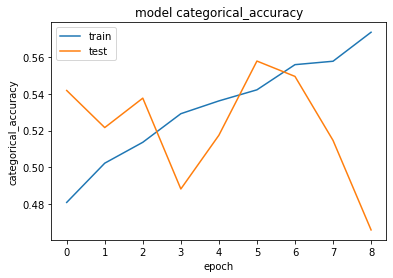

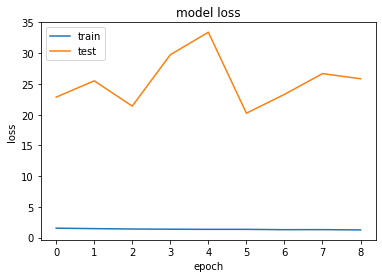

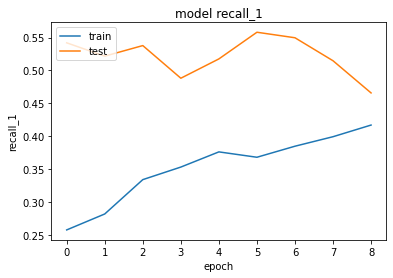

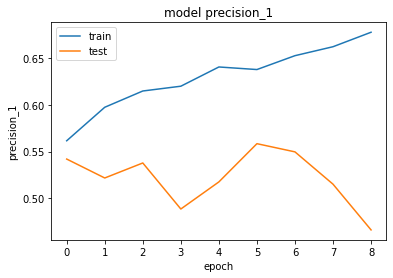

In [24]:
display(modelhistory.history.keys())
# summarize history for accuracy
for basedisplayhistorykey in ['categorical_accuracy', 'loss', 'recall_1', 'precision_1']:
    plt.plot(modelhistory.history[basedisplayhistorykey])
    plt.plot(modelhistory.history['val_'+basedisplayhistorykey])
    plt.title('model '+basedisplayhistorykey)
    plt.ylabel(basedisplayhistorykey)
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

# 使用基本CNN：multi-label classification

In [12]:
modelprefix = 'ownbeansclassify-badbeanscondensed-basicCNN-circleloss-sampleweights-lrschedule-leakyrelu-'
callbackTensorboard = LRTensorBoard(log_dir=os.path.join(tensorboardLogsPath,modelprefix))
modelprefix = os.path.join(modelSavePath, modelprefix)

In [13]:
#multi-label classification

inputs = tf.keras.layers.Input(shape=X_all.shape[1:]) #(anotationMaxHeight,anotationMaxWidth,3)
#layer = tf.keras.layers.experimental.preprocessing.Normalization(axis=-1)(inputs)
layer = tf.keras.layers.experimental.preprocessing.RandomFlip(mode='horizontal_and_vertical',seed=seed)(inputs)
layer = tf.keras.layers.experimental.preprocessing.RandomRotation(0.2, fill_mode='reflect',seed=seed)(layer)
layer = tf.keras.layers.Conv2D(16, 3, padding='same', activation='relu')(layer)
layer = tf.keras.layers.MaxPooling2D()(layer)
layer = tf.keras.layers.Conv2D(32, 3, padding='same', activation='relu')(layer)
layer = tf.keras.layers.MaxPooling2D()(layer)
layer = tf.keras.layers.Conv2D(64, 3, padding='same', activation='relu')(layer)
layer = tf.keras.layers.MaxPooling2D()(layer)
#layer = tf.keras.layers.Flatten()(layer)
layer = tf.keras.layers.GlobalAveragePooling2D()(layer)
layer = tf.keras.layers.Dense(128, activation='relu')(layer)
outputs = tf.keras.layers.Dense(num_classes, activation='sigmoid')(layer)
model = tf.keras.models.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=optimizer,
              loss=preferredLoss,
              weighted_metrics=preferredMetrics)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 460, 500, 3)]     0         
_________________________________________________________________
random_flip (RandomFlip)     (None, 460, 500, 3)       0         
_________________________________________________________________
random_rotation (RandomRotat (None, 460, 500, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 460, 500, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 230, 250, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 230, 250, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 115, 125, 32)      0     

In [16]:
#trainGenerator.fit(X_train)
#tfa.losses.SigmoidFocalCrossEntropy()
#import tensorflow_addons as tfa
#metric = tfa.metrics.F1Score(num_classes=3, threshold=0.5)
#callbackEarlystopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", restore_best_weights=True, patience=25)
 
modelhistory = model.fit(#x=X_train, y=y_train,
    traindataset,
    validation_data = validdataset,
    steps_per_epoch = steps_per_epoch,
    validation_steps = validation_steps,
    validation_batch_size = batch_size,
    #steps_per_epoch = X_train.shape[0] // batchSize,
    #validation_steps = X_val.shape[0] // batchSize,
    #steps_per_epoch=len(x_train) / batchSize,
    callbacks = [callbackReducelr,callbackLRscheduler,callbackTensorboard,callbackModelcheckpoint_with_filepath(modelprefix)],
    #callbackTensorboard,callbackModelcheckpoint_with_filepath(modelprefix)
    initial_epoch=120, #assign 120 would start at 121
    epochs=160,
    #sample_weight=train_sample_weights_needed,
    #class_weight=train_class_weights,
    use_multiprocessing=True
 )
#steps_per_epoch,num_train_steps,warmup_steps = commonsettings.calcSteps(case_nums=case_nums, batch_size=batch_size, epochs=epochs, warmup_steps_ratio=warmup_steps_ratio)


Epoch 121/160

Epoch 00121: LearningRateScheduler reducing learning rate to tf.Tensor(0.010242641, shape=(), dtype=float32).
165/165 [==============================] - 122s 739ms/step - loss: 7.9846 - binary_accuracy: 0.9176 - recall: 0.8591 - precision: 0.8964 - f1_score: 0.8687 - AUC: 0.9449 - val_loss: 8.6765 - val_binary_accuracy: 0.9103 - val_recall: 0.8541 - val_precision: 0.8818 - val_f1_score: 0.8560 - val_AUC: 0.9399

Epoch 00121: saving model to /opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/tj/ownbeansclassify-badbeanscondensed-basicCNN-circleloss-sampleweights-lrschedule-leakyrelu--.epoch121-val_loss8.67653-val_f1_score0.86-val_AUC0.94-val_recall0.85-val_precision0.88-val_binary_accuracy0.91.hdf5
Epoch 122/160

Epoch 00122: LearningRateScheduler reducing learning rate to tf.Tensor(0.010158524, shape=(), dtype=float32).
165/165 [==============================] - 118s 714ms/step - loss: 7.5719 - binary_accuracy: 0.9211 - recall: 0.8662 - precision: 0.8999 - f1_score

KeyboardInterrupt: 

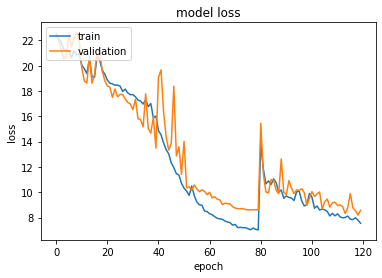

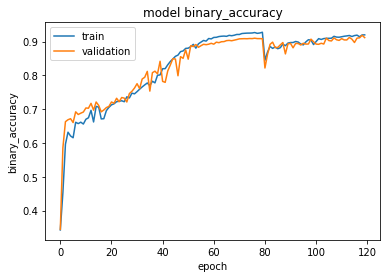

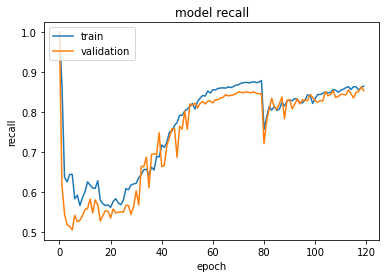

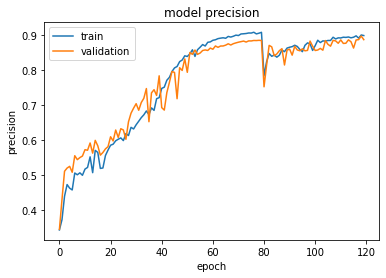

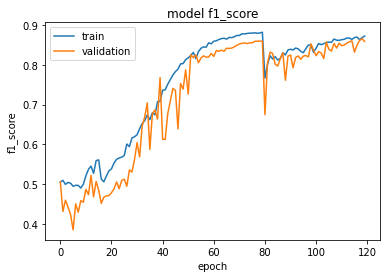

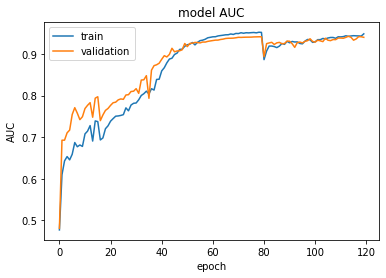

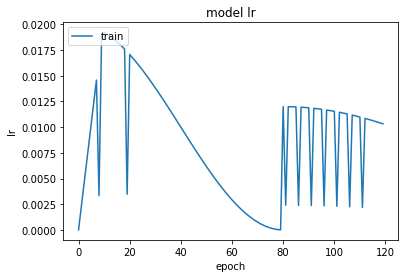

In [15]:
commonsettings.plot_model_history(modelhistory)

# 預測

In [15]:
resPred = model.predict(X_val)

In [ ]:
copiedResPred = copy.deepcopy(resPred)
copiedResPred[copiedResPred>0.5] = 1
copiedResPred[copiedResPred<=0.5] = 0
copiedResPredDf = pd.DataFrame(copiedResPred)
copiedResPredDf.columns = labelDict.keys()
for i in range(50):
    predictLabels = (copiedResPredDf.iloc[[i],:].to_dict(orient='records'))[0]
    predictLabels = [key for key,l in predictLabels.items() if l!=0]
    display(predictLabels)
    imShow(X_val[i])

# 使用InceptionV3 Transfer Learning freeze weight 沒有 schedule learningrate

In [6]:
import tensorflow_addons as tfa

num_classes = len(labelDict)
inputs = tf.keras.layers.Input(shape=X_train.shape[1:]) #(anotationMaxHeight,anotationMaxWidth,3)
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
base_model.trainable = False
layer = base_model(inputs)
#layer = tf.keras.layers.Conv2D(16, 3, padding='same', activation='relu')(layer)
#layer = tf.keras.layers.MaxPooling2D()(layer)
#layer = tf.keras.layers.Conv2D(32, 3, padding='same', activation='relu')(layer)
#layer = tf.keras.layers.MaxPooling2D()(layer)
#layer = tf.keras.layers.Conv2D(64, 3, padding='same', activation='relu')(layer)
#layer = tf.keras.layers.MaxPooling2D()(layer)
#layer = tf.keras.layers.Flatten()(layer)
#layer = tf.keras.layers.Dense(128, activation='relu')(layer)
layer = tf.keras.layers.GlobalMaxPool2D()(layer)
layer = tf.keras.layers.Dense(256, activation=tf.keras.layers.LeakyReLU(alpha=0.01))(layer)
outputs = tf.keras.layers.Dense(num_classes, activation='sigmoid')(layer)
model = tf.keras.models.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=tfa.optimizers.AdamW(),
              loss=tfa.losses.SigmoidFocalCrossEntropy(),
              metrics=[
                  tfa.metrics.F1Score(num_classes=num_classes,average='macro',threshold=0.5,name='f1_score'),
                  #tfa.metrics.HammingLoss(threshold=0.5,mode='multilabel',name='hammingloss'),
                  tf.keras.metrics.BinaryAccuracy(name='binary_accuracy'),
                  tf.keras.metrics.Recall(name='recall'),
                  tf.keras.metrics.Precision(name='precision')
              ])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 460, 500, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, None, None, 2048)  21802784  
_________________________________________________________________
global_max_pooling2d (Global (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               524544    
_________________________________________________________________
dense_1 (Dense)              (None, 16)                4112      
Total params: 22,331,440
Trainable params: 528,656
Non-trainable params: 21,802,784
_________________________________________________________________


In [ ]:
batchSize = 32
epochs = 70

callbackEarlystopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", restore_best_weights=True, patience=40)
callbackModelcheckpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath="multilabelClassifyTransLearn-weights.epoch{epoch:02d}-val_loss{val_loss:.2f}-val_f1_score{val_f1_score:.2f}-val_binary_accuracy{val_binary_accuracy:.2f}-val_recall{val_recall:.2f}-val_precision{val_precision:.2f}.hdf5",
    monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False,
    mode='min', save_freq='epoch', options=None
)

modelhistory = model.fit(#x=X_train, y=y_train,
    trainDatagen.flow(X_train, y_train, batch_size=batchSize),
    validation_data = (X_val, y_val),
    #steps_per_epoch = X_train.shape[0] // batchSize,
    #validation_steps = X_val.shape[0] // batchSize,
    #steps_per_epoch=len(x_train) / batchSize,
    callbacks = [callbackEarlystopping,callbackModelcheckpoint],
    epochs=epochs,
    batch_size=batchSize)

Epoch 1/70
125/125 [==============================] - ETA: 0s - loss: 1.8913 - f1_score: 0.0608 - binary_accuracy: 0.9230 - recall: 0.1496 - precision: 0.3597

/anaconda/envs/cfb/lib/python3.8/site-packages/tensorflow/python/keras/metrics.py:254: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  warnings.warn('Metric %s implements a `reset_states()` method; rename it '


125/125 [==============================] - 212s 2s/step - loss: 1.8913 - f1_score: 0.0608 - binary_accuracy: 0.9230 - recall: 0.1496 - precision: 0.3597 - val_loss: 11.9821 - val_f1_score: 0.0331 - val_binary_accuracy: 0.8899 - val_recall: 0.1792 - val_precision: 0.1905

Epoch 00001: saving model to multilabelClassifyTransLearn-weights.epoch01-val_loss11.98-val_f1_score0.03-val_binary_accuracy0.89-val_recall0.18-val_precision0.19.hdf5
Epoch 2/70
  2/125 [..............................] - ETA: 2:41 - loss: 1.3862 - f1_score: 0.0340 - binary_accuracy: 0.9297 - recall: 0.0857 - precision: 0.4286

dict_keys(['loss', 'f1_score', 'binary_accuracy', 'recall', 'precision', 'val_loss', 'val_f1_score', 'val_binary_accuracy', 'val_recall', 'val_precision'])

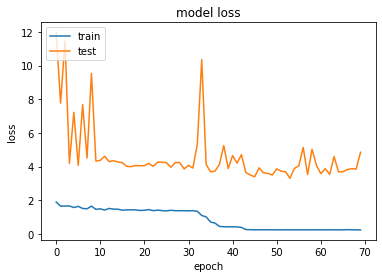

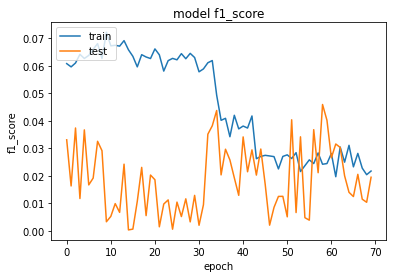

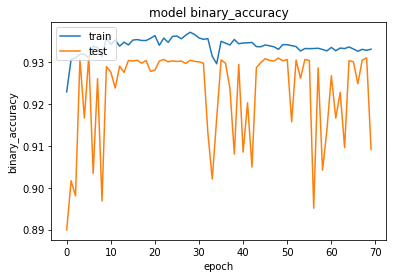

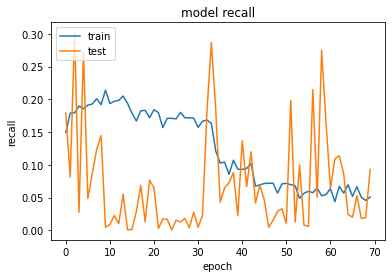

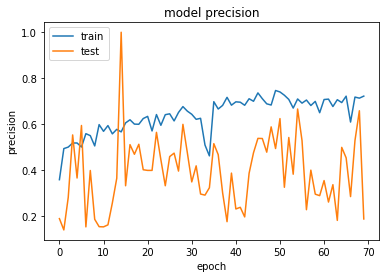

In [8]:
display(modelhistory.history.keys())
# summarize history for accuracy
for basedisplayhistorykey in ['loss', 'f1_score', 'binary_accuracy', 'recall', 'precision']:
    plt.plot(modelhistory.history[basedisplayhistorykey])
    plt.plot(modelhistory.history['val_'+basedisplayhistorykey])
    plt.title('model '+basedisplayhistorykey)
    plt.ylabel(basedisplayhistorykey)
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

# 使用InceptionV3 Transfer Learning freeze weight 採用 schedule learningrate

* https://www.pythonf.cn/read/132747
* https://www.jeremyjordan.me/nn-learning-rate/

In [13]:
modelprefix = 'ownbeansclassify-badcondense-DenseNet121-normalized-circleloss-norefreshtflearnweights-sampleweights-lrschedule-leakyrelu'
callbackTensorboard = LRTensorBoard(log_dir=os.path.join(tensorboardLogsPath,modelprefix))
modelprefix = os.path.join(modelSavePath, modelprefix)
if True:
    conti_model = 'ownbeansclassify-badcondense-DenseNet121-normalized-circleloss-norefreshtflearnweights-sampleweights-lrschedule-leakyrelu-.epoch055-val_loss6.69505-val_f1_score0.89-val_AUC0.96-val_recall0.90-val_precision0.90-val_binary_accuracy0.93.hdf5'
    conti_model = os.path.join(modelSavePath, conti_model)
    print(conti_model)
    model = tf.keras.models.load_model(conti_model, custom_objects={'CircleLoss':preferredLoss})
    model.summary()

/opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/tj/ownbeansclassify-badcondense-DenseNet121-normalized-circleloss-norefreshtflearnweights-sampleweights-lrschedule-leakyrelu-.epoch055-val_loss6.69505-val_f1_score0.89-val_AUC0.96-val_recall0.90-val_precision0.90-val_binary_accuracy0.93.hdf5


In [38]:
modelprefix = 'ownbeansclassify-badcondense-DenseNet121-normalized-circleloss-norefreshtflearnweights-w{}h{}-lrschedule-leakyrelu'.format(targetAnotationMaxHeight,targetAnotationMaxWidth)
callbackTensorboard = LRTensorBoard(log_dir=os.path.join(tensorboardLogsPath,modelprefix))
modelprefix = os.path.join(modelSavePath, modelprefix)
inputs = tf.keras.layers.Input(shape=(targetAnotationMaxHeight,targetAnotationMaxWidth,3)) #(anotationMaxHeight,anotationMaxWidth,3)
layer = img_augmentation(inputs)
#layer = tf.keras.layers.experimental.preprocessing.Resizing(224,224)(layer)
base_model = tf.keras.applications.DenseNet121(include_top=False, weights='imagenet')
base_model.trainable = False
layer = base_model(layer, training=False)
layer = tf.keras.layers.GlobalAveragePooling2D()(layer)
layer = tf.keras.layers.Dense(256, activation=tf.keras.layers.LeakyReLU(alpha=0.01))(layer)
#layer = tf.keras.layers.Dropout(rate=0.15)(layer)
outputs = tf.keras.layers.Dense(num_classes, activation='sigmoid')(layer)
model = tf.keras.models.Model(inputs=inputs, outputs=outputs)

model.compile(optimizer=optimizer, loss=preferredLoss, weighted_metrics=preferredMetrics)
model.summary() #, metrics=preferredMetrics

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 299, 325, 3)]     0         
_________________________________________________________________
img_augmentation (Sequential (None, 299, 325, 3)       7         
_________________________________________________________________
densenet121 (Functional)     (None, None, None, 1024)  7037504   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1024)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               262400    
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 771       
Total params: 7,300,682
Trainable params: 263,171
Non-trainable params: 7,037,511
_____________________________________________

In [ ]:
modelhistory = model.fit(
    traindataset,
    validation_data = validdataset,
    steps_per_epoch = steps_per_epoch,
    validation_steps = validation_steps,
    validation_batch_size = batch_size,
    #steps_per_epoch = X_train.shape[0] // batchSize,
    #validation_steps = X_val.shape[0] // batchSize,
    #steps_per_epoch=len(x_train) / batchSize,
    #initial_epoch = 55,
    callbacks = [callbackReducelr,callbackLRscheduler,callbackTensorboard,callbackModelcheckpoint_with_filepath(modelprefix)],
    epochs = epochs,
    #sample_weight=train_sample_weights_needed,
    #class_weight=train_class_weights,
    use_multiprocessing = True
)

Epoch 1/120

Epoch 00001: LearningRateScheduler reducing learning rate to tf.Tensor(0.0, shape=(), dtype=float32).
183/183 [==============================] - ETA: 0s - loss: 25.7337 - binary_accuracy: 0.5876 - recall: 0.4337 - precision: 0.4068 - f1_score: 0.3520 - AUC: 0.4969

/opt/conda/envs/python3_datascience_ready/lib/python3.8/site-packages/tensorflow/python/keras/metrics.py:254: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  warnings.warn('Metric %s implements a `reset_states()` method; rename it '


183/183 [==============================] - 193s 883ms/step - loss: 25.7337 - binary_accuracy: 0.5876 - recall: 0.4337 - precision: 0.4068 - f1_score: 0.3520 - AUC: 0.4969 - val_loss: 24.8721 - val_binary_accuracy: 0.5941 - val_recall: 0.4410 - val_precision: 0.4094 - val_f1_score: 0.3693 - val_AUC: 0.5145

Epoch 00001: saving model to /opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/tj/ownbeansclassify-badcondense-DenseNet121-normalized-circleloss-norefreshtflearnweights-w299h325-lrschedule-leakyrelu-.epoch001-val_loss24.87210-val_f1_score0.37-val_AUC0.51-val_recall0.44-val_precision0.41-val_binary_accuracy0.59.hdf5
Epoch 2/120

Epoch 00002: LearningRateScheduler reducing learning rate to tf.Tensor(0.0020833332, shape=(), dtype=float32).
183/183 [==============================] - 158s 865ms/step - loss: 11.3581 - binary_accuracy: 0.8725 - recall: 0.7989 - precision: 0.8250 - f1_score: 0.7888 - AUC: 0.9134 - val_loss: 7.8941 - val_binary_accuracy: 0.9156 - val_recall: 0.8617 - v

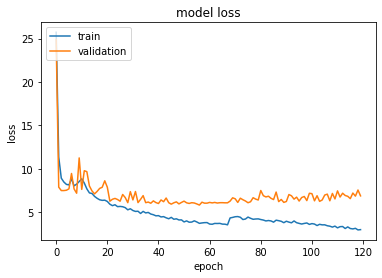

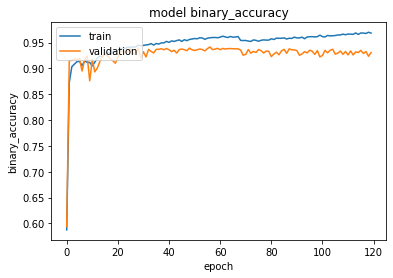

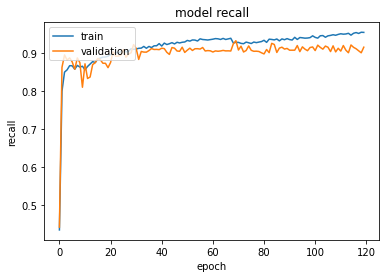

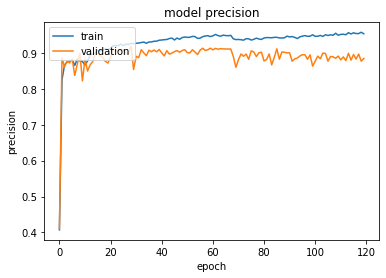

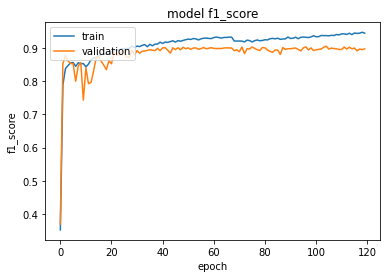

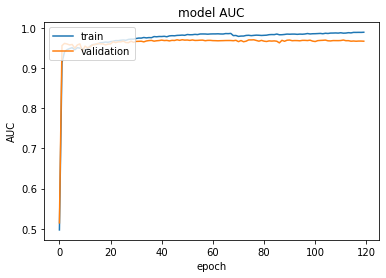

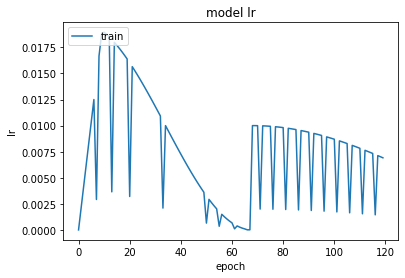

In [40]:
commonsettings.plot_model_history(modelhistory)

# Model Prediction

In [14]:
clsModel = '/opt/mnt/code-391ff5ac-6576-460f-ba4d-7e03433c68b6/Users/tj/ownbeansclassify-badcondense-DenseNet121-normalized-circleloss-norefreshtflearnweights-sampleweights-lrschedule-leakyrelu-.epoch059-val_loss5.80211-val_f1_score0.89-val_AUC0.97-val_recall0.90-val_precision0.92-val_binary_accuracy0.94.hdf5'
clsModel = tf.keras.models.load_model(clsModel, custom_objects={'CircleLoss':preferredLoss})

['value.y.Good', 'value.y.UnlabelledBean', 'value.y.belongsToBad']

array([0.00646299, 0.27765724, 0.7675381 ], dtype=float32)

['value.y.belongsToBad']

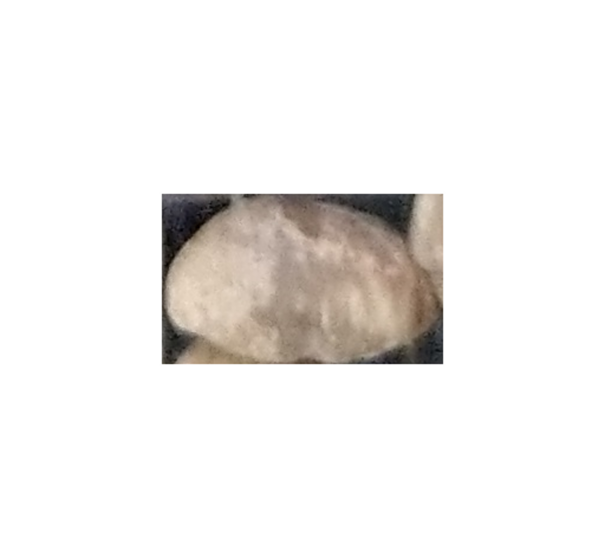

array([0.9865268 , 0.15378036, 0.23673655], dtype=float32)

['value.y.Good']

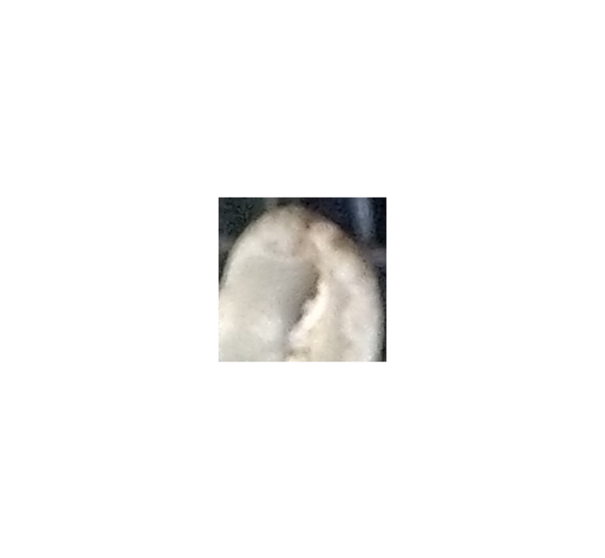

array([0.00337568, 0.6692385 , 0.36734694], dtype=float32)

['value.y.UnlabelledBean']

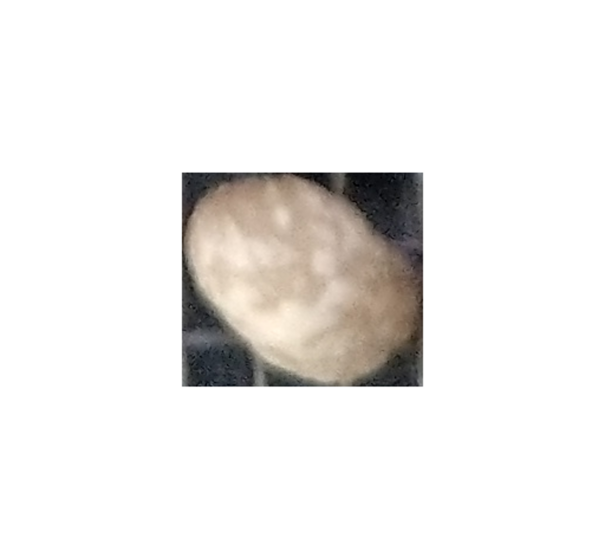

array([0.835282  , 0.20749734, 0.26860443], dtype=float32)

['value.y.Good']

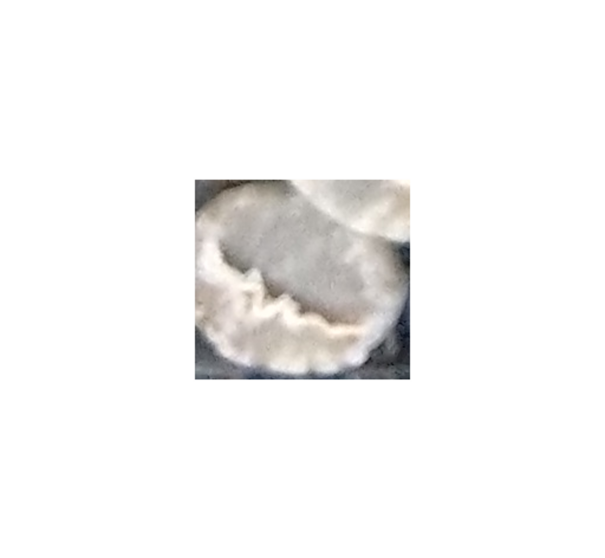

array([0.01935713, 0.06728345, 0.9372117 ], dtype=float32)

['value.y.belongsToBad']

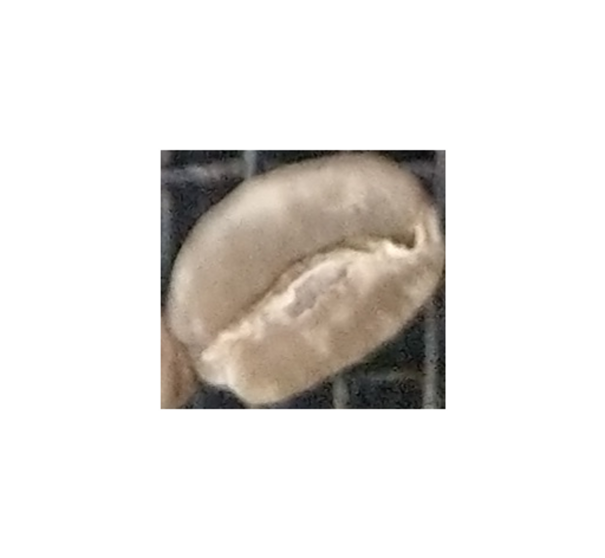

array([0.01584634, 0.44047847, 0.7167095 ], dtype=float32)

['value.y.belongsToBad']

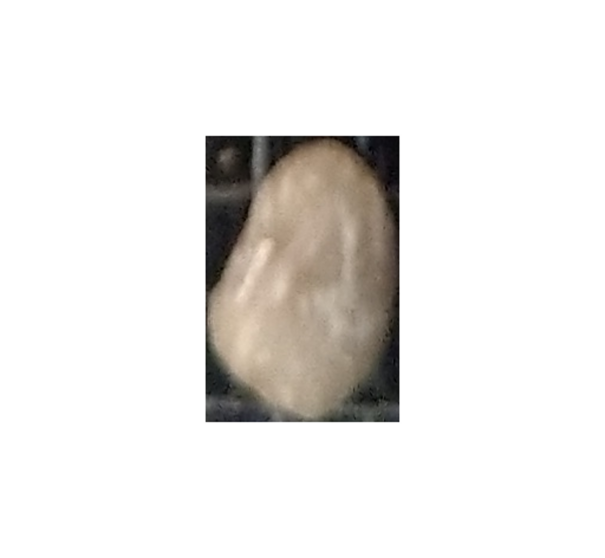

array([0.19910762, 0.17196721, 0.7505696 ], dtype=float32)

['value.y.belongsToBad']

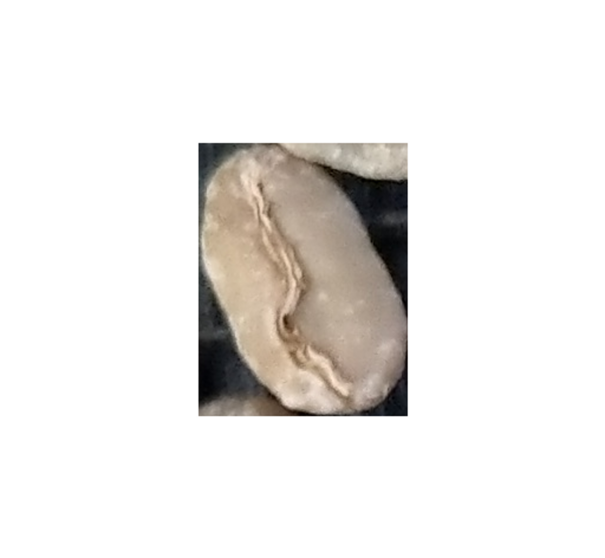

array([0.24883884, 0.15110181, 0.60841686], dtype=float32)

['value.y.belongsToBad']

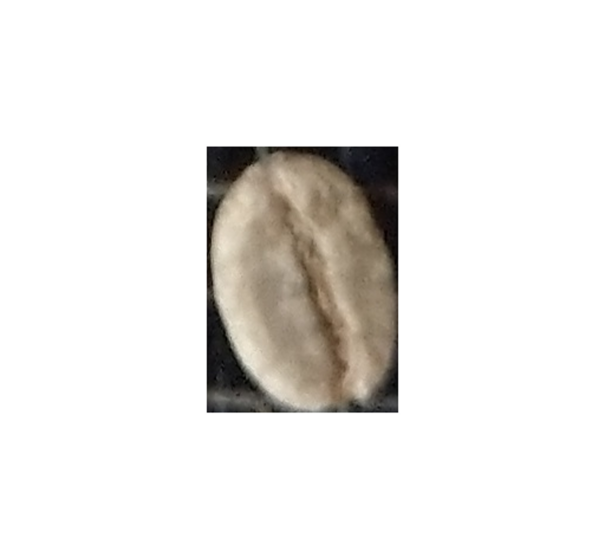

array([0.03871799, 0.11908191, 0.80419654], dtype=float32)

['value.y.belongsToBad']

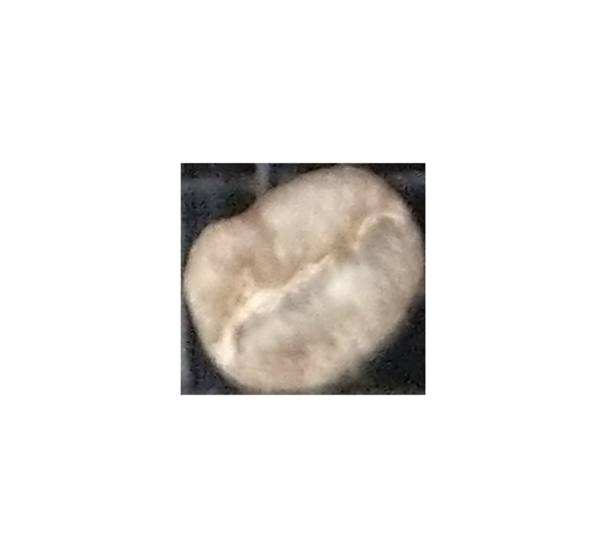

array([0.01337462, 0.5316898 , 0.41440815], dtype=float32)

['value.y.UnlabelledBean']

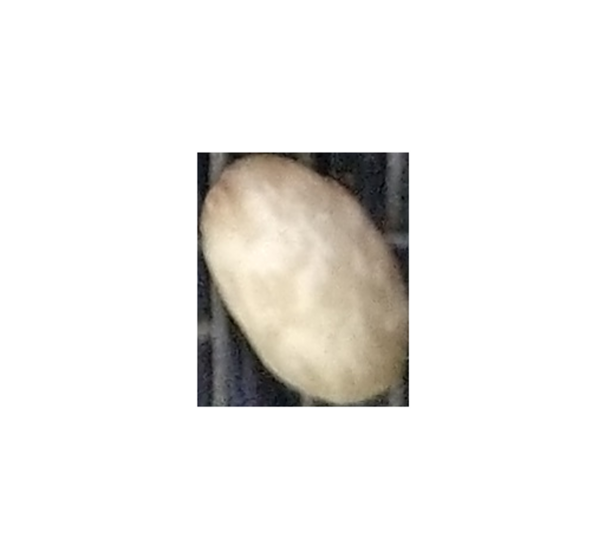

array([0.00114361, 0.8125155 , 0.33806348], dtype=float32)

['value.y.UnlabelledBean']

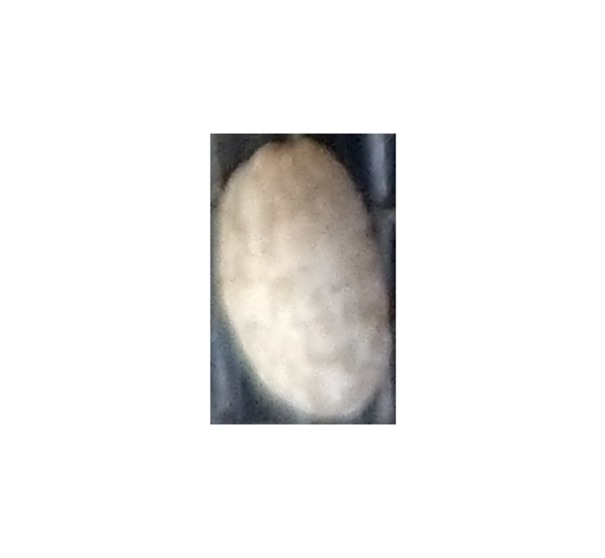

array([0.6682988 , 0.20953839, 0.41430297], dtype=float32)

['value.y.Good']

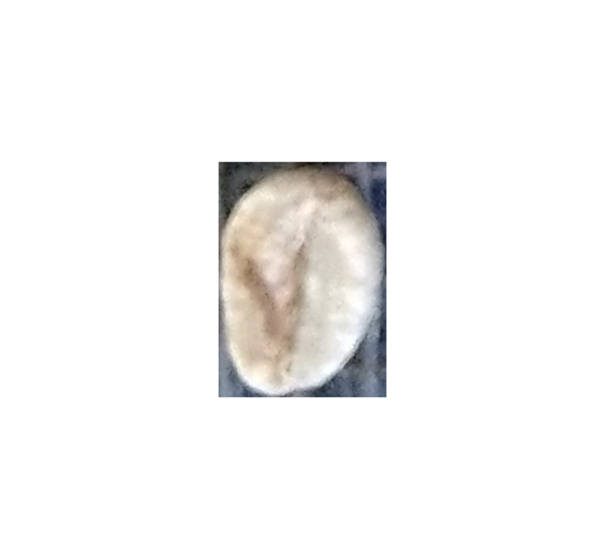

array([2.4828380e-05, 7.1357423e-01, 4.2798176e-01], dtype=float32)

['value.y.UnlabelledBean']

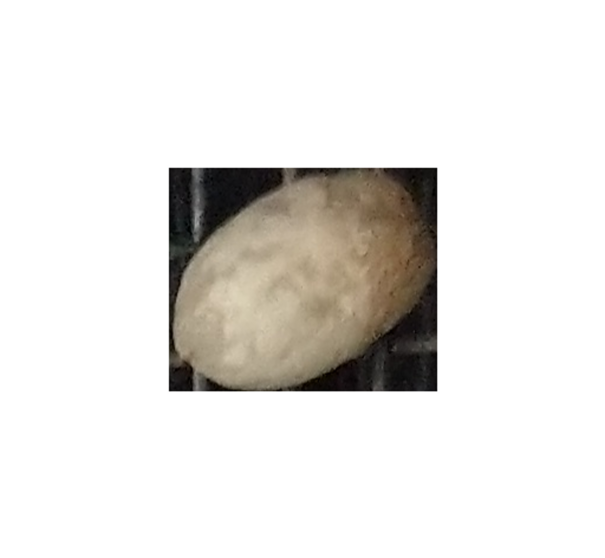

array([0.2584056 , 0.20281194, 0.6301409 ], dtype=float32)

['value.y.belongsToBad']

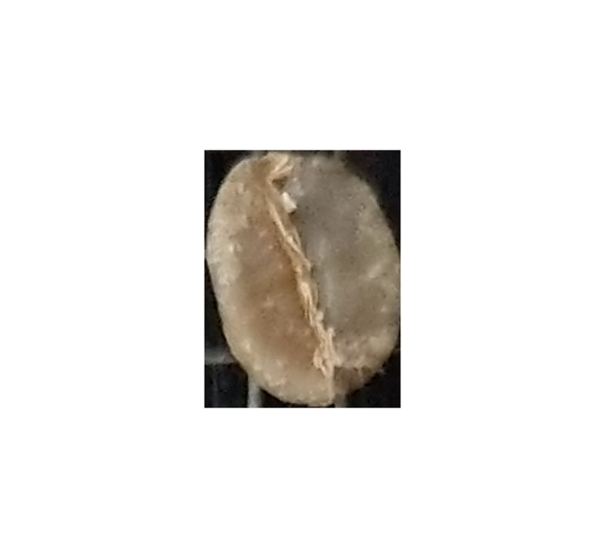

array([1.3720593e-04, 2.3056856e-01, 8.0106473e-01], dtype=float32)

['value.y.belongsToBad']

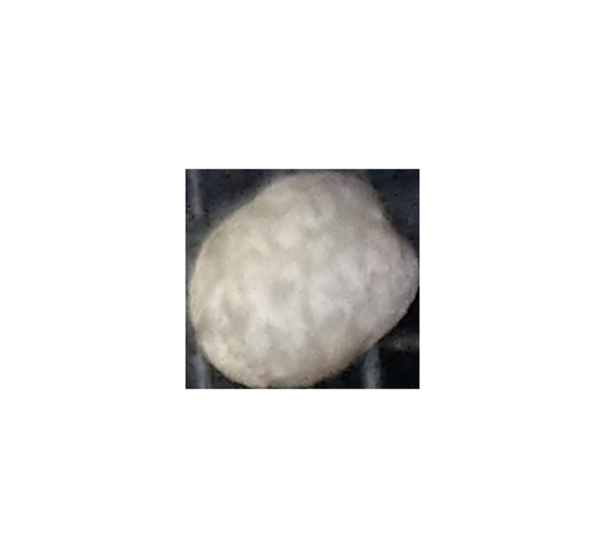

array([3.8634309e-05, 8.1030524e-01, 2.5631404e-01], dtype=float32)

['value.y.UnlabelledBean']

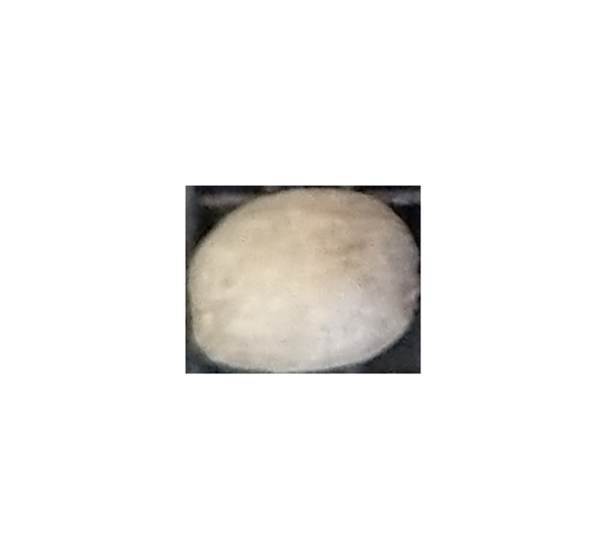

array([0.00212971, 0.31389868, 0.7348041 ], dtype=float32)

['value.y.belongsToBad']

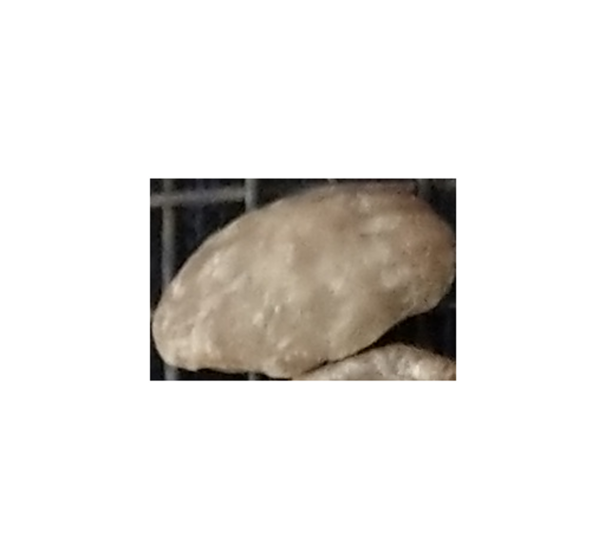

array([0.01119813, 0.11730763, 0.9250099 ], dtype=float32)

['value.y.belongsToBad']

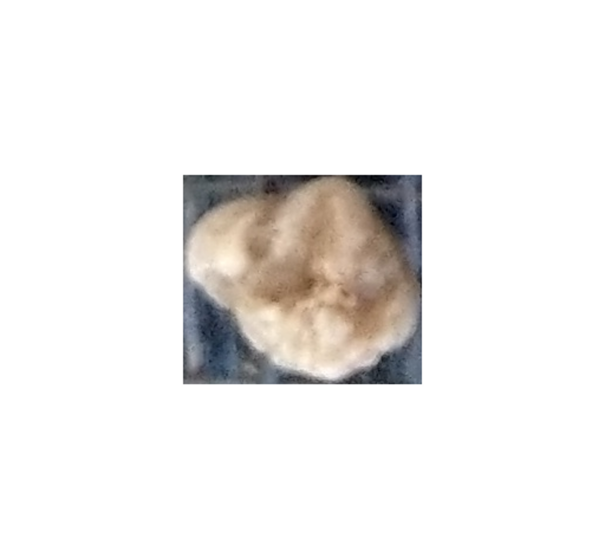

array([0.13158758, 0.13538827, 0.7620566 ], dtype=float32)

['value.y.belongsToBad']

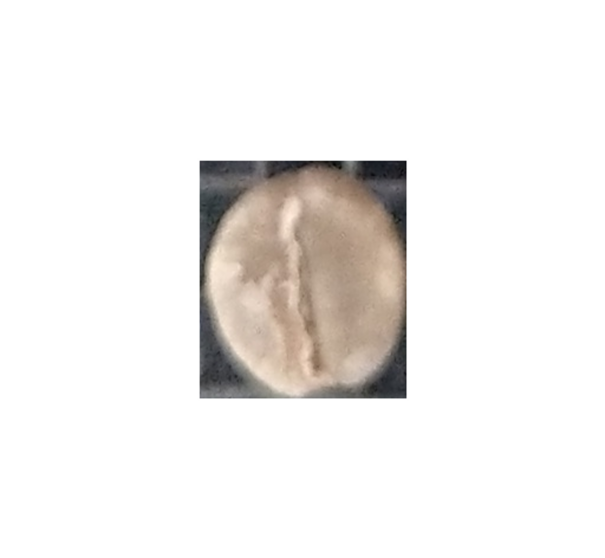

array([0.92742527, 0.21052141, 0.1660719 ], dtype=float32)

['value.y.Good']

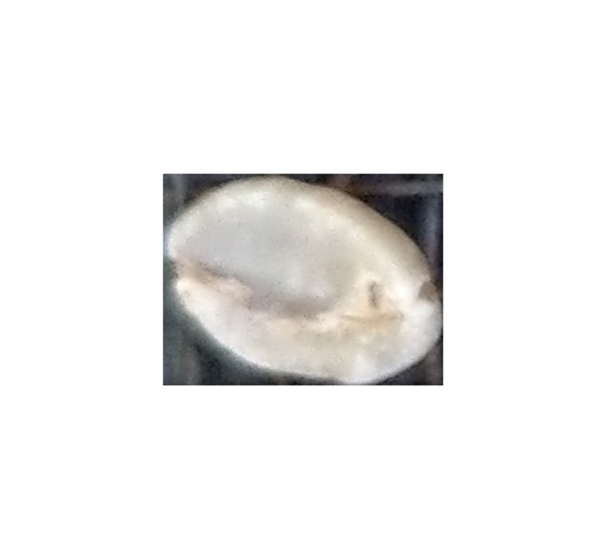

array([0.00910609, 0.39573357, 0.6744613 ], dtype=float32)

['value.y.belongsToBad']

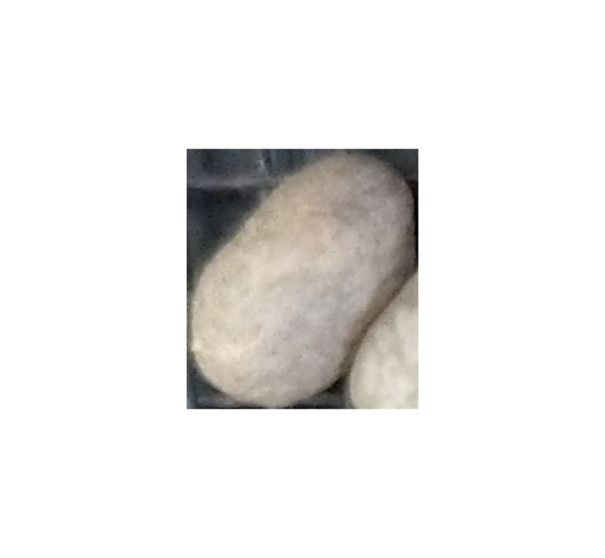

array([2.2701651e-04, 7.2638702e-01, 2.7100310e-01], dtype=float32)

['value.y.UnlabelledBean']

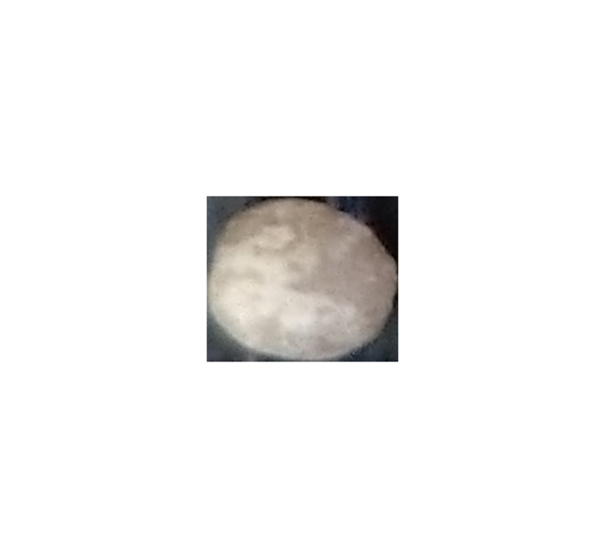

array([6.6371380e-05, 3.0323571e-01, 6.8460625e-01], dtype=float32)

['value.y.belongsToBad']

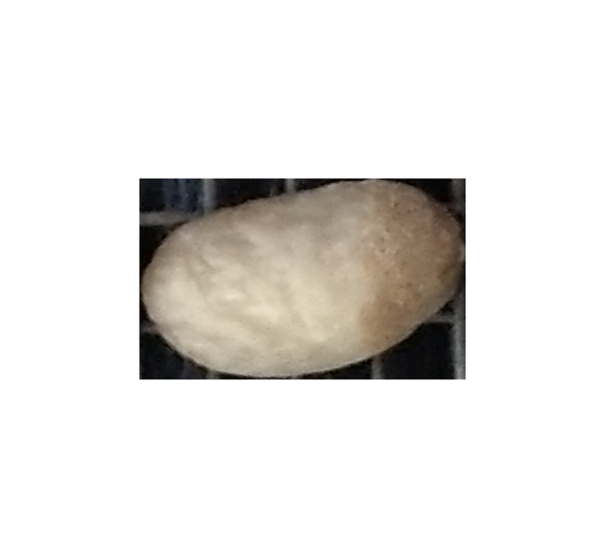

array([0.0984646 , 0.17659456, 0.6463706 ], dtype=float32)

['value.y.belongsToBad']

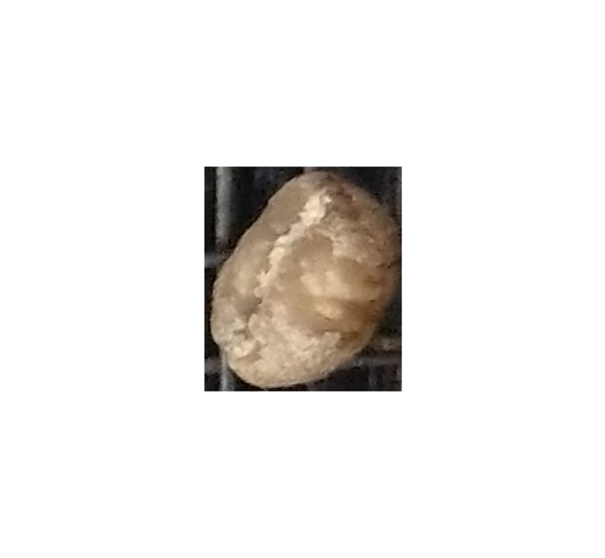

array([0.9295423 , 0.21474457, 0.1957745 ], dtype=float32)

['value.y.Good']

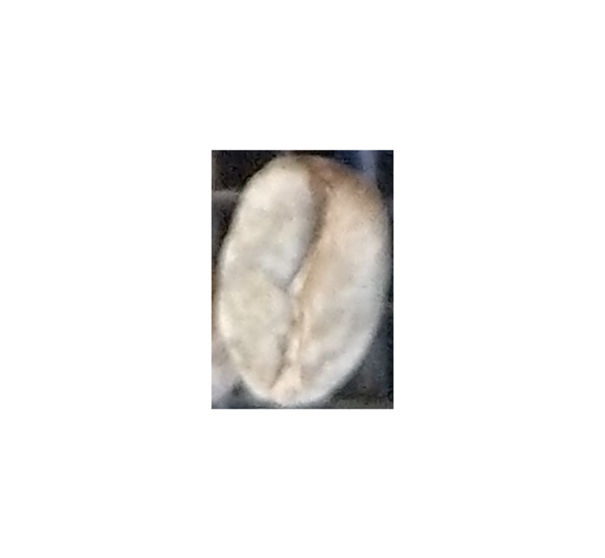

array([0.53157455, 0.3317247 , 0.25963974], dtype=float32)

['value.y.Good']

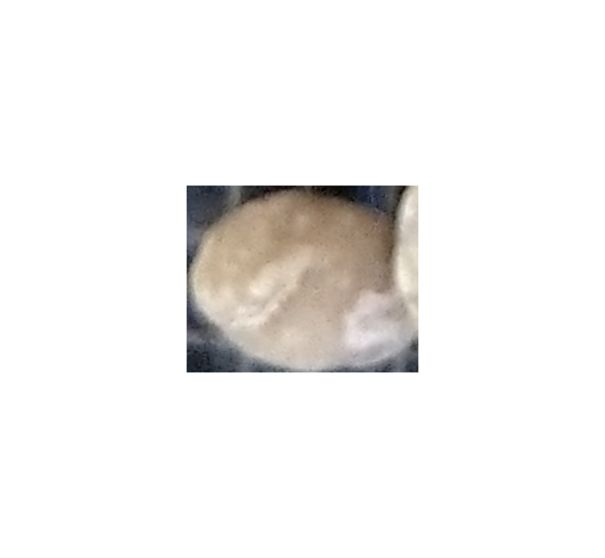

array([0.7082153 , 0.18155046, 0.46244234], dtype=float32)

['value.y.Good']

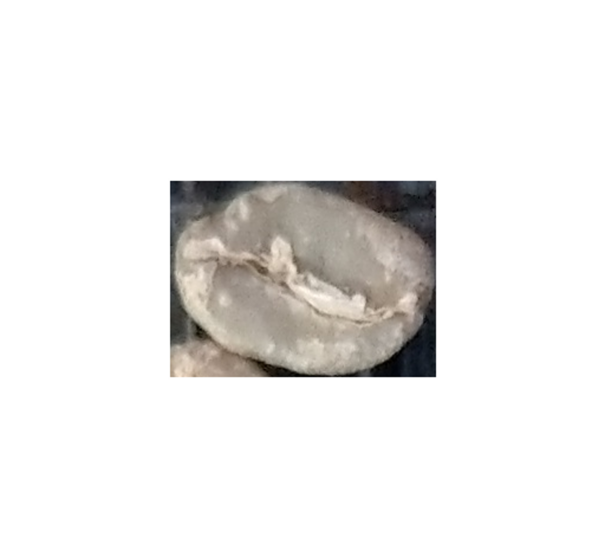

array([6.6427475e-07, 8.0173033e-01, 5.7373834e-01], dtype=float32)

['value.y.UnlabelledBean', 'value.y.belongsToBad']

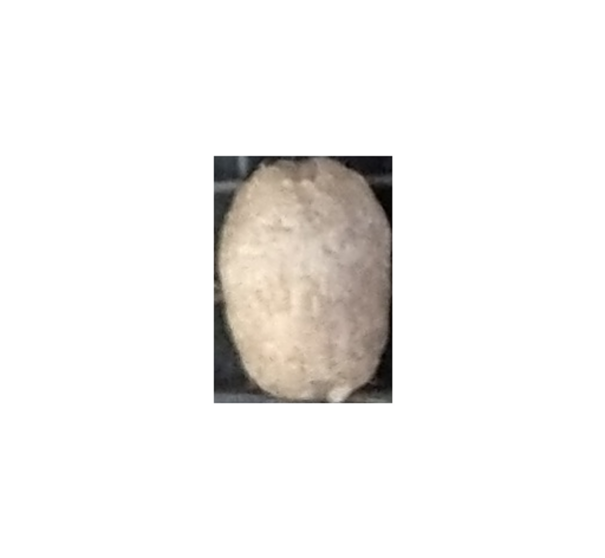

array([0.10946551, 0.14661433, 0.73605937], dtype=float32)

['value.y.belongsToBad']

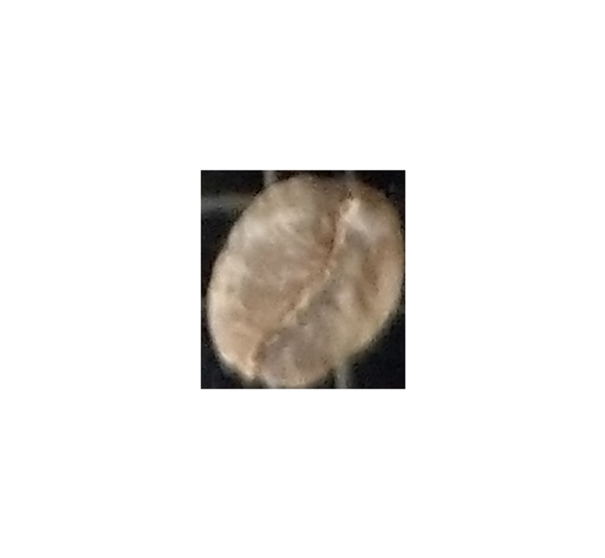

array([0.86225855, 0.20836495, 0.25190967], dtype=float32)

['value.y.Good']

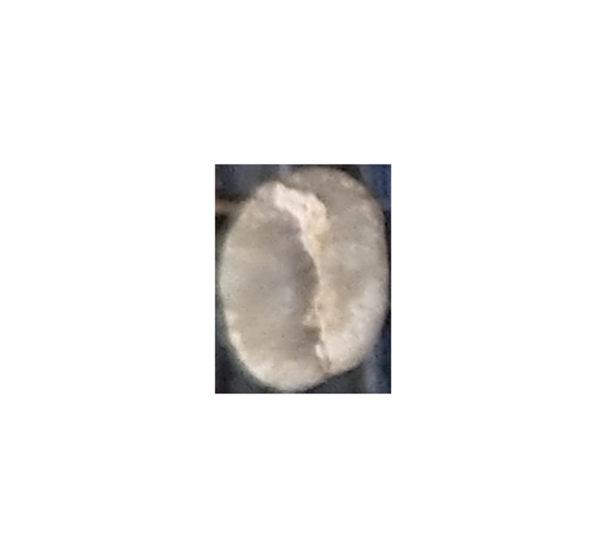

array([0.01045035, 0.04598252, 0.93459874], dtype=float32)

['value.y.belongsToBad']

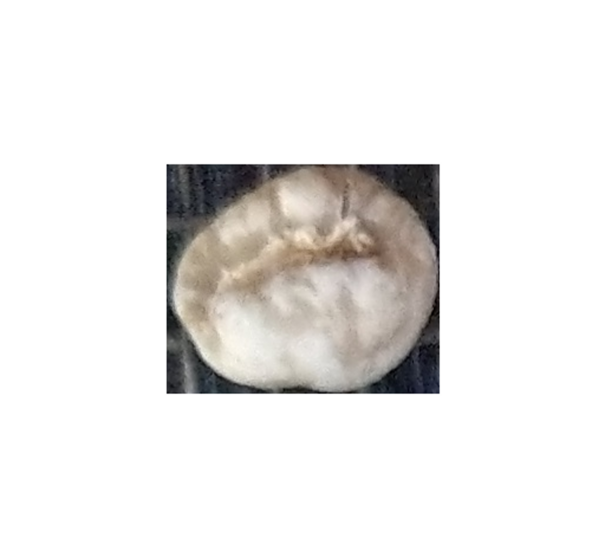

array([0.39522612, 0.14812304, 0.574364  ], dtype=float32)

['value.y.belongsToBad']

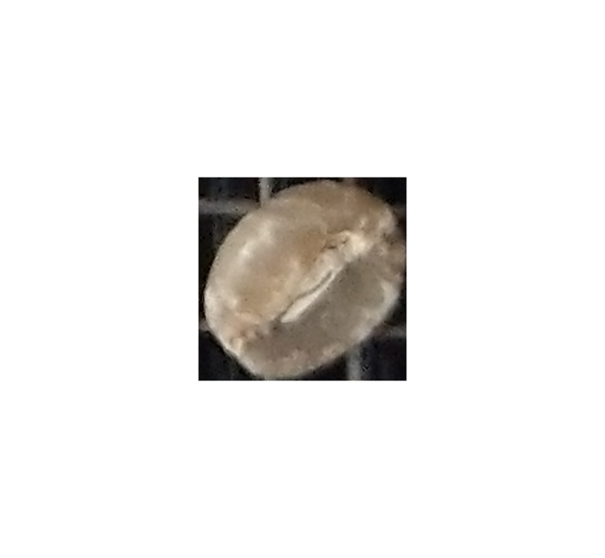

array([7.0805058e-06, 2.1562222e-01, 9.1319209e-01], dtype=float32)

['value.y.belongsToBad']

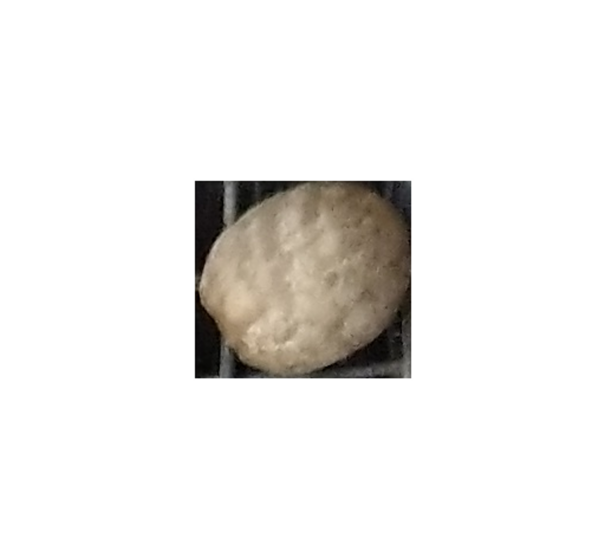

array([2.8711071e-04, 4.0556556e-01, 7.1479058e-01], dtype=float32)

['value.y.belongsToBad']

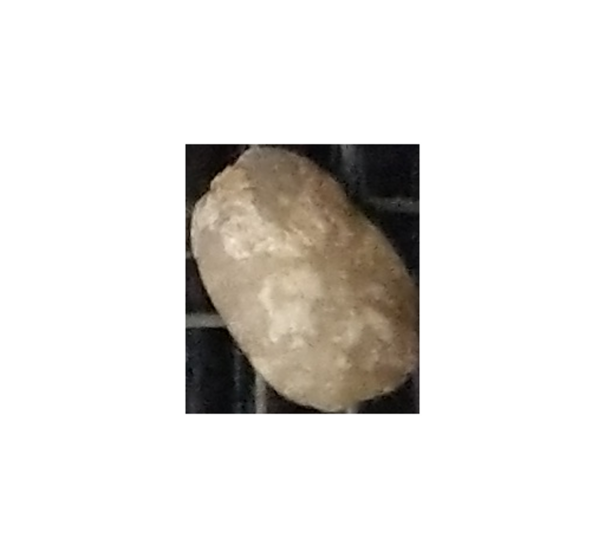

array([0.54788405, 0.33028284, 0.2892959 ], dtype=float32)

['value.y.Good']

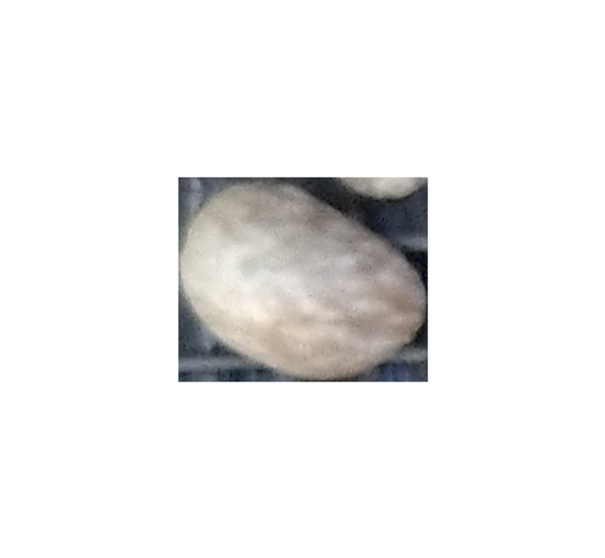

array([0.64017904, 0.22288422, 0.3826611 ], dtype=float32)

['value.y.Good']

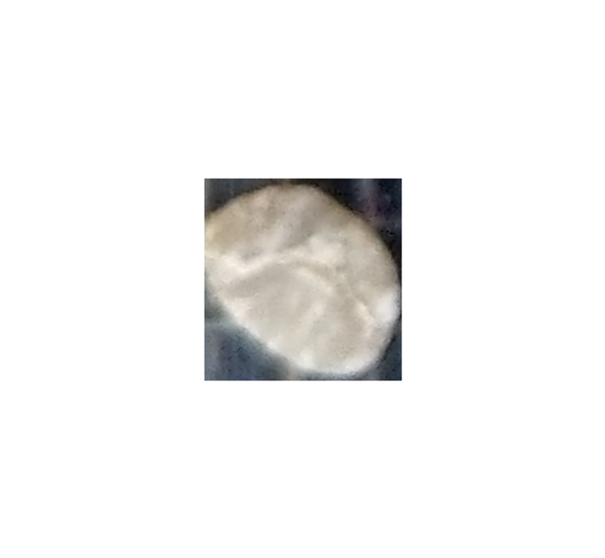

array([0.6412669, 0.1619933, 0.5252875], dtype=float32)

['value.y.Good', 'value.y.belongsToBad']

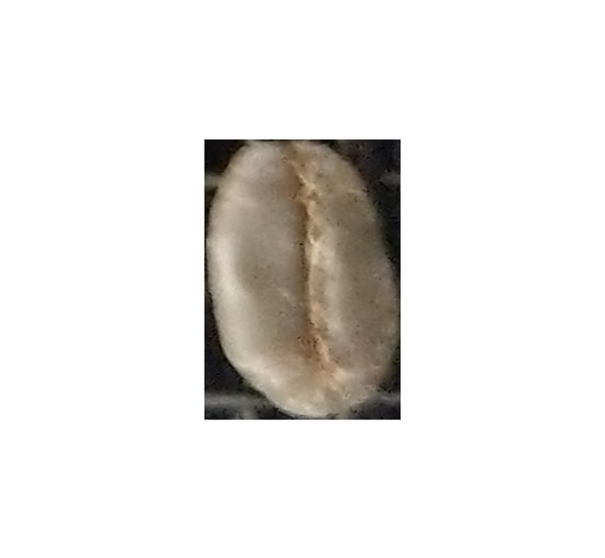

array([0.7371534 , 0.2389357 , 0.30905473], dtype=float32)

['value.y.Good']

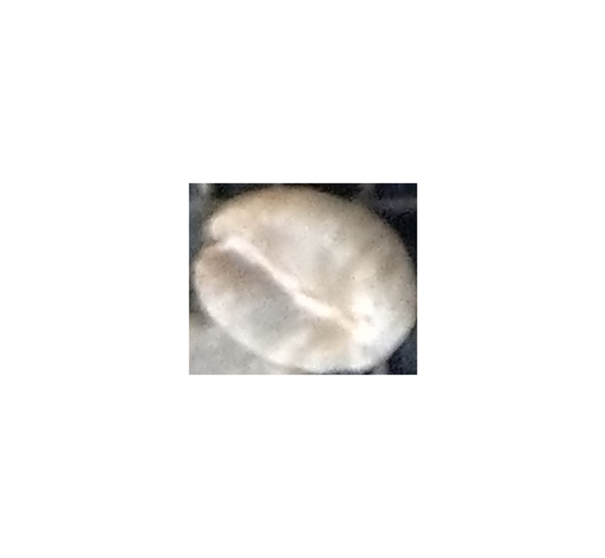

array([0.01374771, 0.24308358, 0.6654338 ], dtype=float32)

['value.y.belongsToBad']

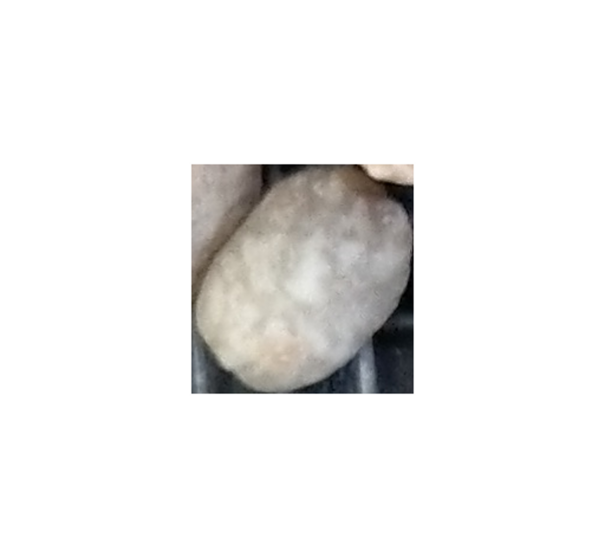

array([0.00577797, 0.6485003 , 0.36512125], dtype=float32)

['value.y.UnlabelledBean']

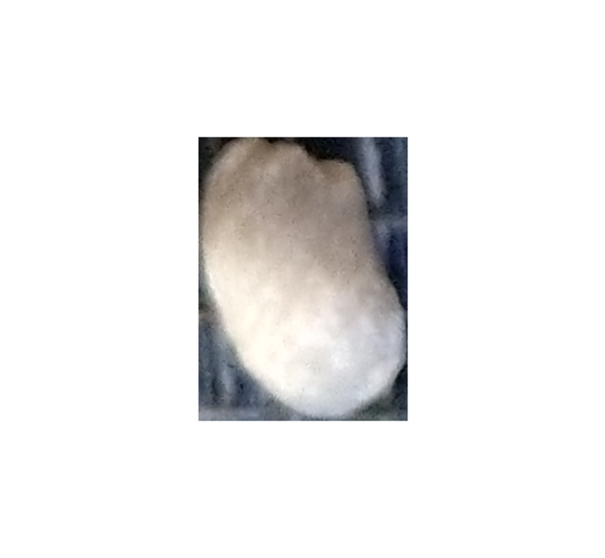

array([0.8576138 , 0.21067059, 0.29382813], dtype=float32)

['value.y.Good']

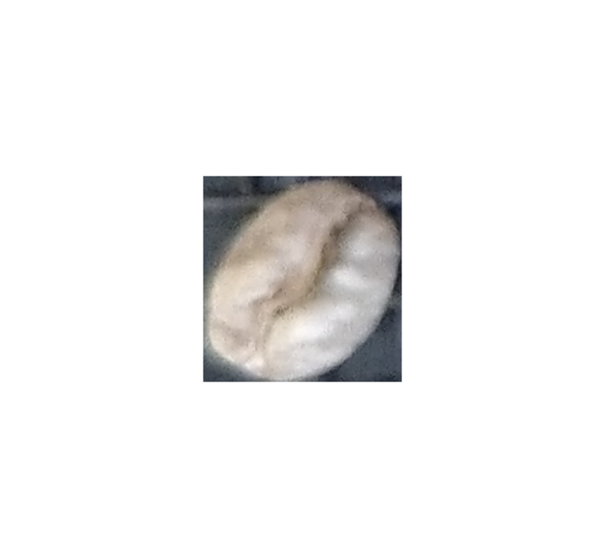

array([0.599132  , 0.16303536, 0.51136935], dtype=float32)

['value.y.Good', 'value.y.belongsToBad']

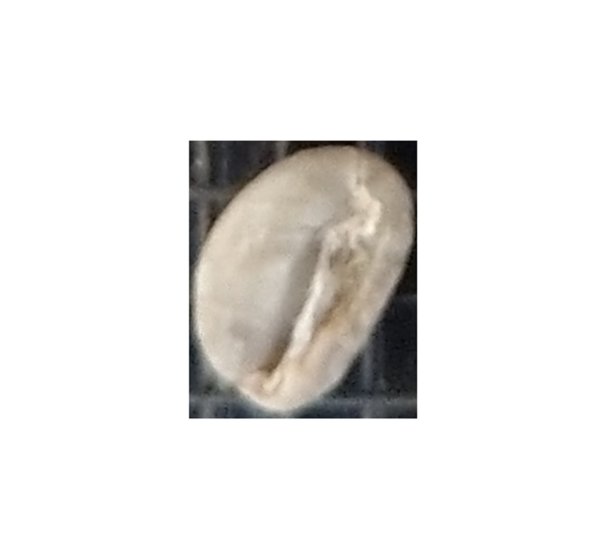

array([0.00335151, 0.90399146, 0.05709896], dtype=float32)

['value.y.UnlabelledBean']

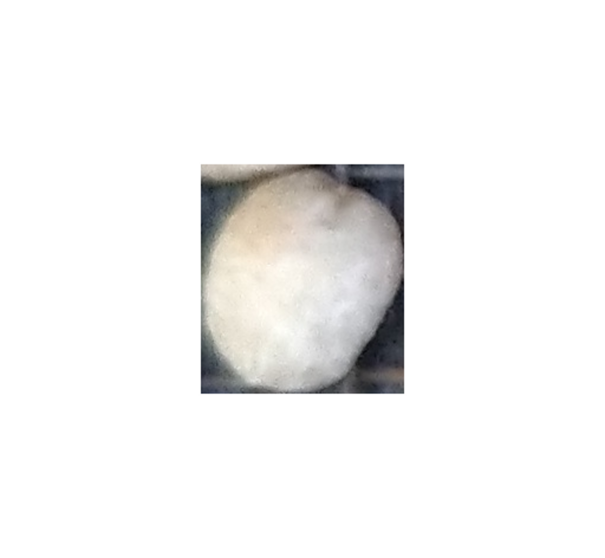

array([6.8958958e-05, 5.2915925e-01, 4.7904637e-01], dtype=float32)

['value.y.UnlabelledBean']

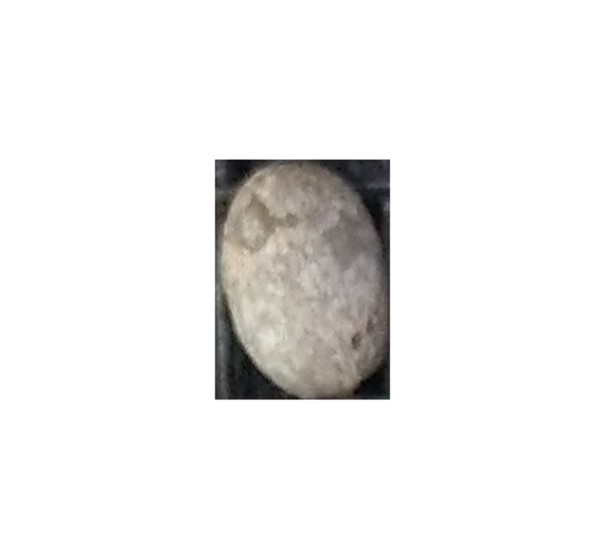

array([0.01182649, 0.24444254, 0.65958124], dtype=float32)

['value.y.belongsToBad']

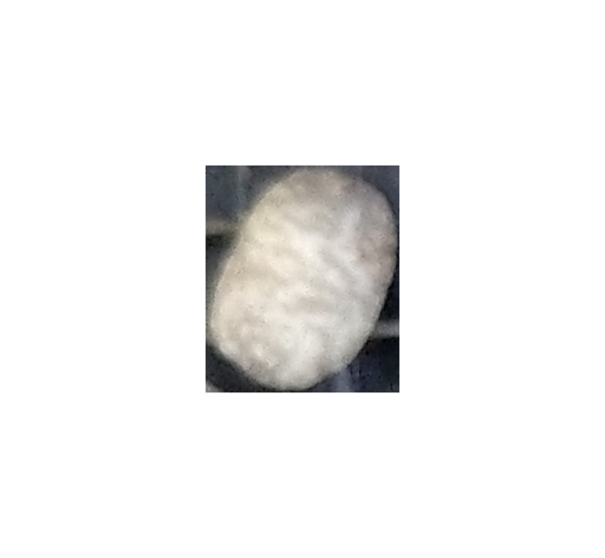

array([1.4557286e-04, 4.5013607e-01, 5.1829004e-01], dtype=float32)

['value.y.belongsToBad']

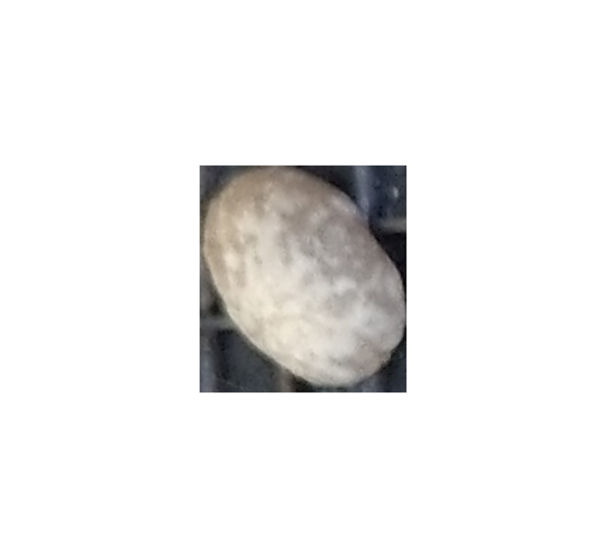

array([2.3926203e-05, 4.0035912e-01, 9.0911227e-01], dtype=float32)

['value.y.belongsToBad']

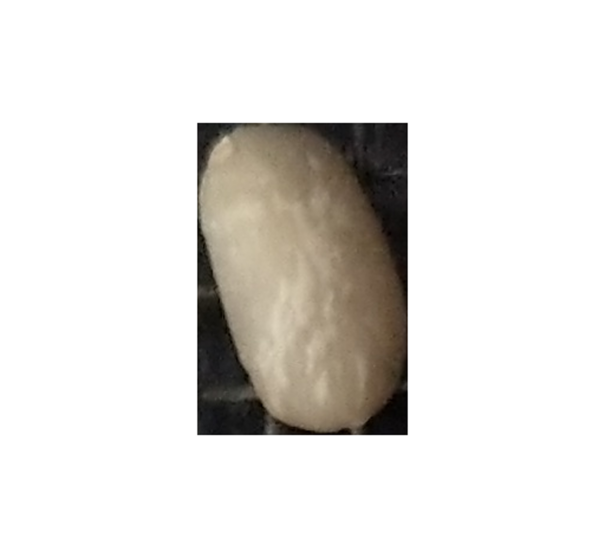

array([0.00488754, 0.02207942, 0.9460853 ], dtype=float32)

['value.y.belongsToBad']

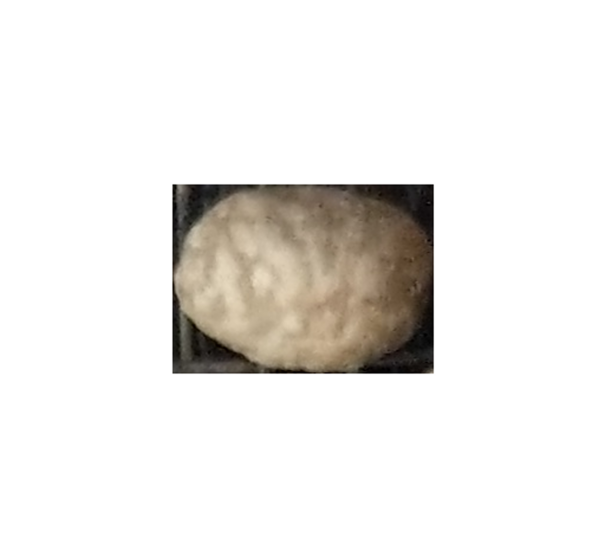

array([0.32607135, 0.19466041, 0.5655833 ], dtype=float32)

['value.y.belongsToBad']

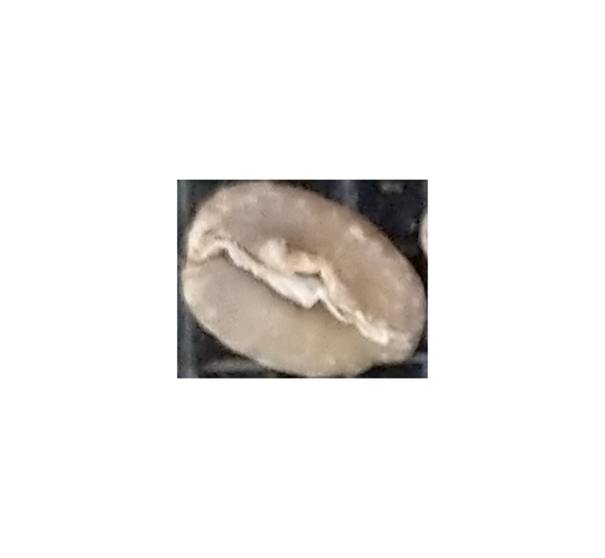

array([0.0510996 , 0.07271642, 0.85376257], dtype=float32)

['value.y.belongsToBad']

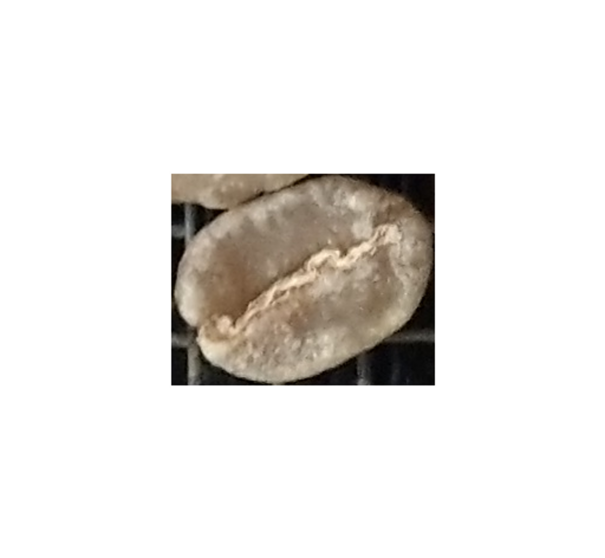

array([7.3615700e-04, 8.7648058e-01, 1.7407717e-01], dtype=float32)

['value.y.UnlabelledBean']

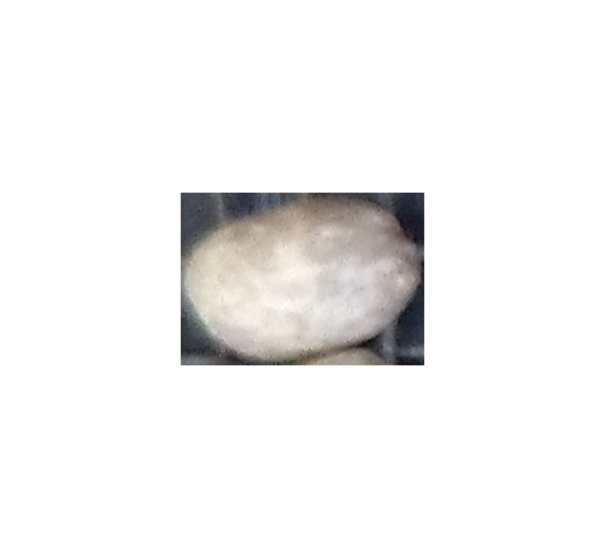

array([0.62585694, 0.2240407 , 0.43463895], dtype=float32)

['value.y.Good']

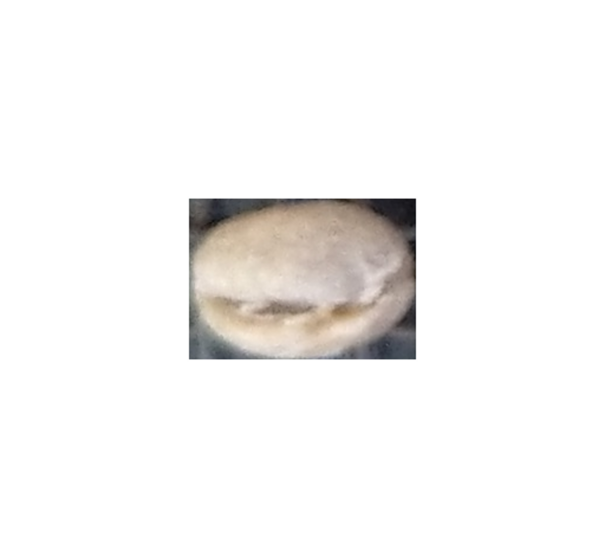

array([0.10016053, 0.1859296 , 0.72290635], dtype=float32)

['value.y.belongsToBad']

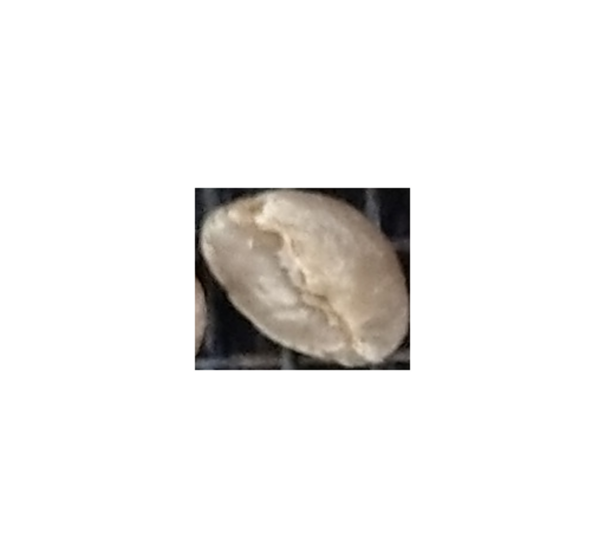

array([0.9616528 , 0.19233955, 0.14212877], dtype=float32)

['value.y.Good']

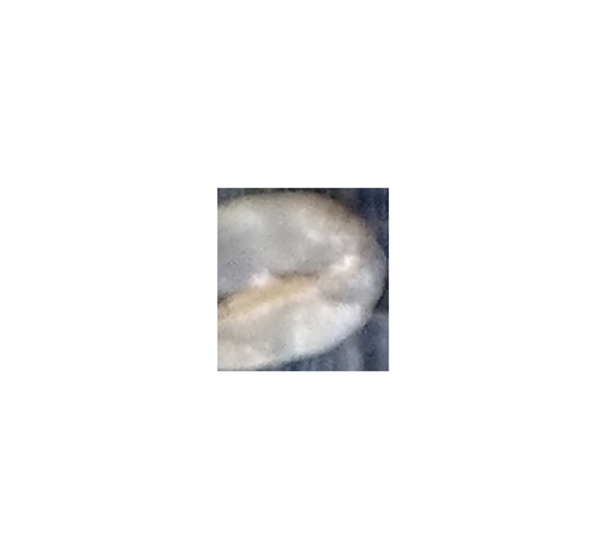

array([7.986942e-05, 4.644887e-01, 5.152712e-01], dtype=float32)

['value.y.belongsToBad']

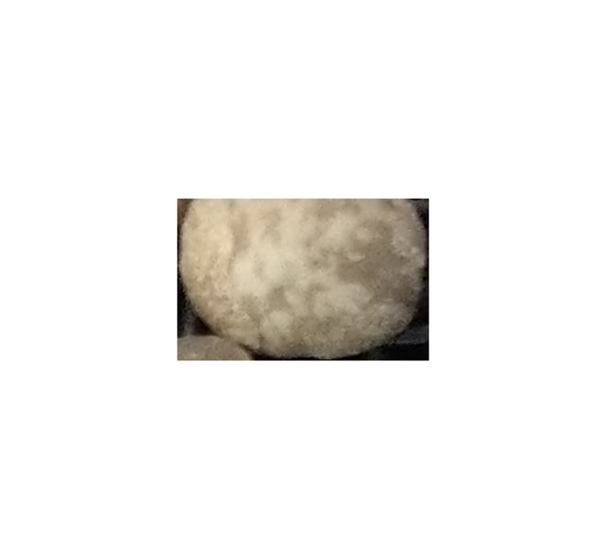

array([1.2695012e-06, 8.6760294e-01, 2.1140261e-01], dtype=float32)

['value.y.UnlabelledBean']

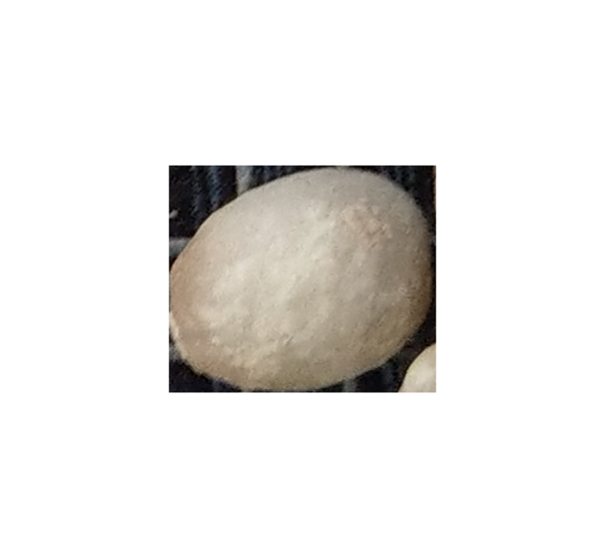

array([0.098887  , 0.20084052, 0.7805654 ], dtype=float32)

['value.y.belongsToBad']

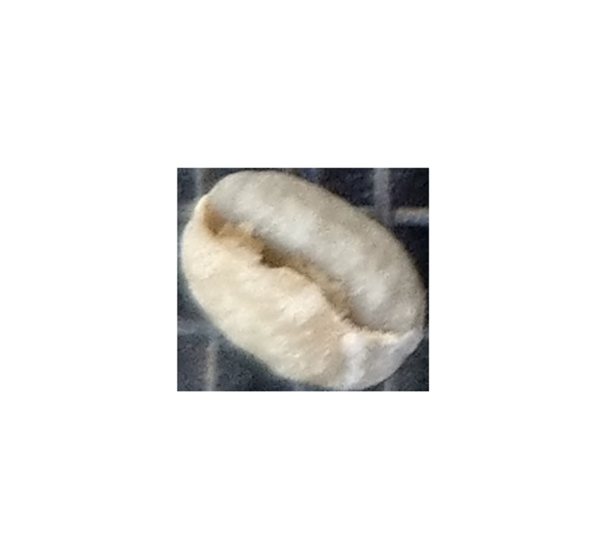

array([5.3680112e-04, 2.8369844e-02, 9.6801007e-01], dtype=float32)

['value.y.belongsToBad']

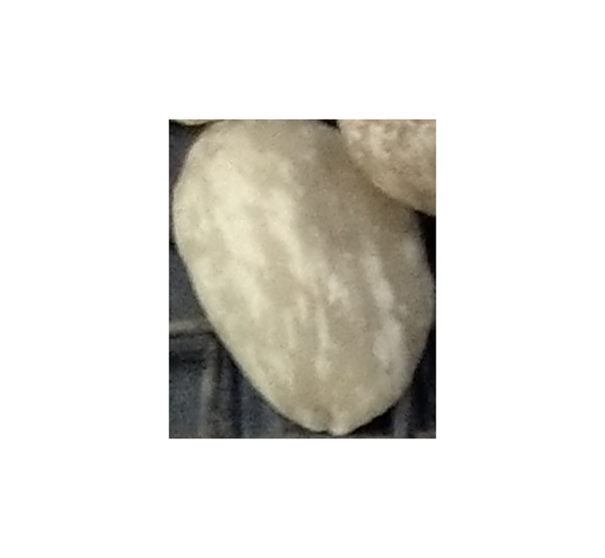

array([0.00346225, 0.17929111, 0.71870804], dtype=float32)

['value.y.belongsToBad']

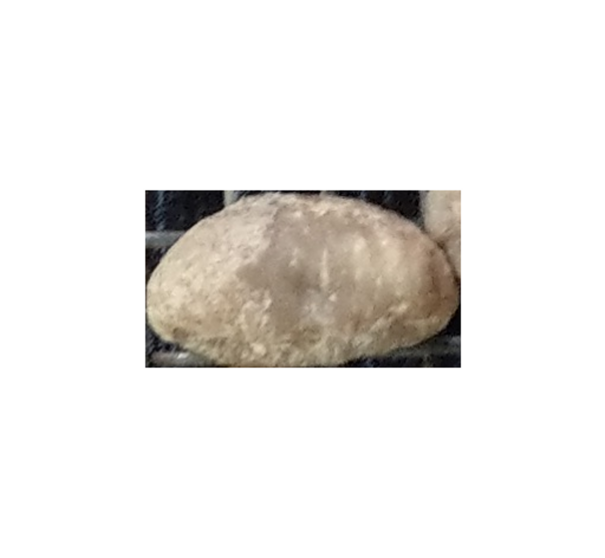

array([0.07961087, 0.0952988 , 0.8092123 ], dtype=float32)

['value.y.belongsToBad']

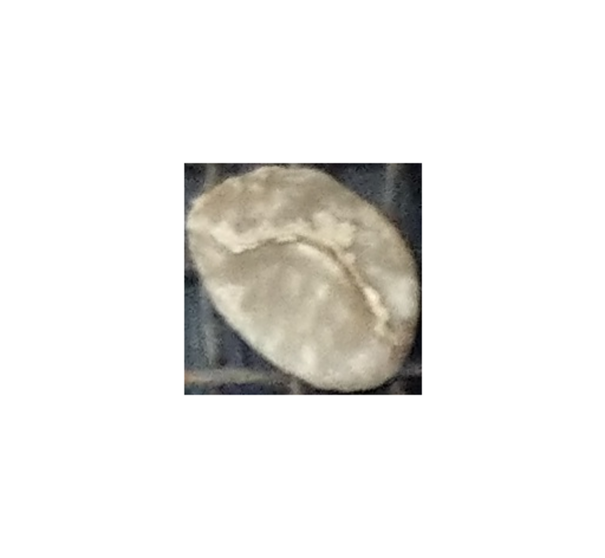

array([4.1689100e-06, 6.6561025e-01, 4.8748636e-01], dtype=float32)

['value.y.UnlabelledBean']

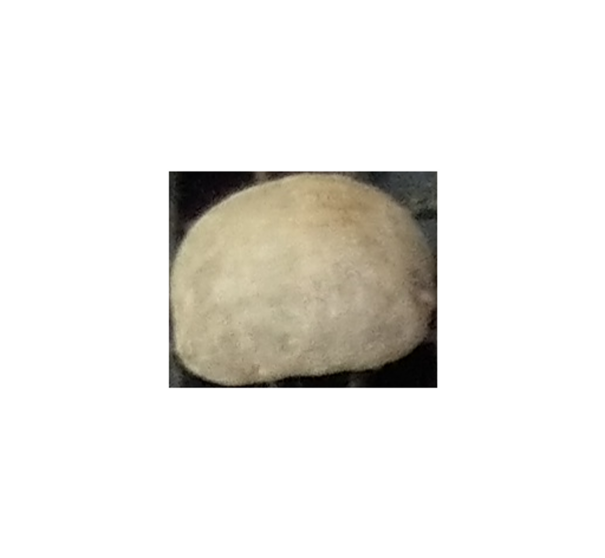

array([4.2069194e-05, 1.2646399e-01, 8.8052118e-01], dtype=float32)

['value.y.belongsToBad']

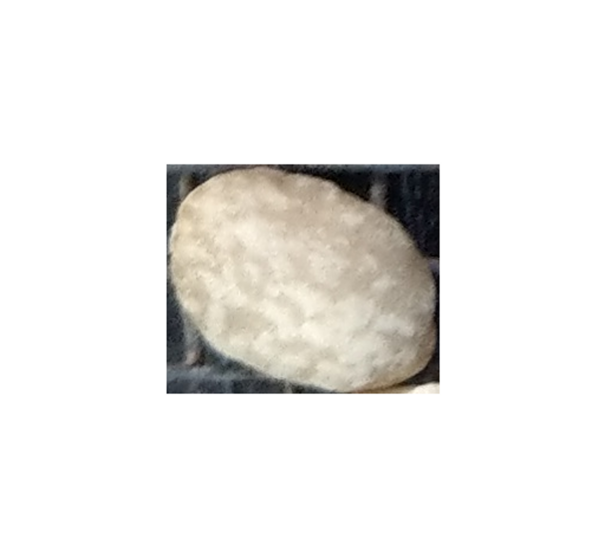

array([1.4312518e-05, 8.5189390e-01, 2.9131877e-01], dtype=float32)

['value.y.UnlabelledBean']

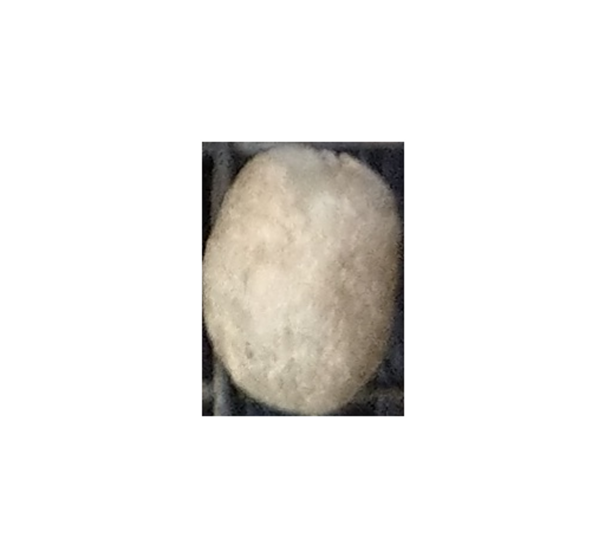

array([0.04403635, 0.08736587, 0.80990267], dtype=float32)

['value.y.belongsToBad']

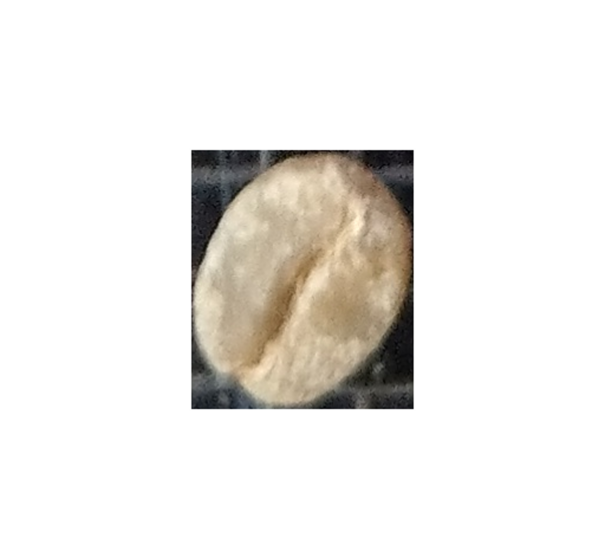

array([0.15137051, 0.60835356, 0.08008048], dtype=float32)

['value.y.UnlabelledBean']

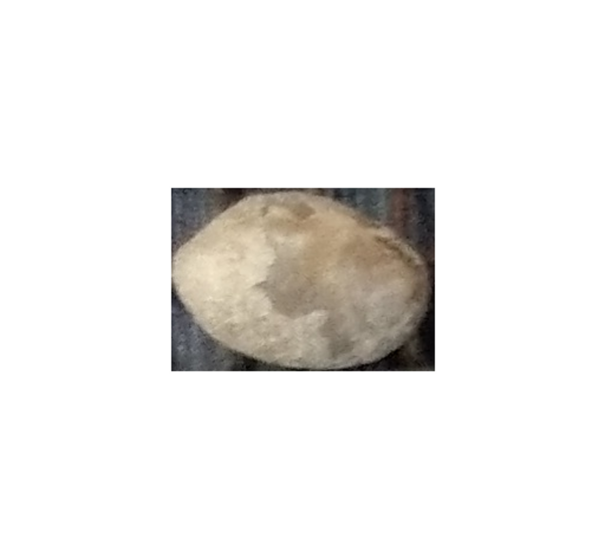

array([2.2867433e-05, 4.0182993e-02, 9.5986032e-01], dtype=float32)

['value.y.belongsToBad']

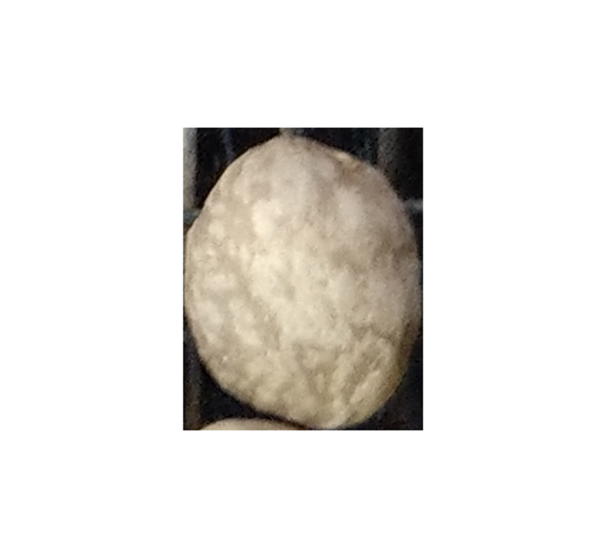

array([0.00203447, 0.09050348, 0.8776482 ], dtype=float32)

['value.y.belongsToBad']

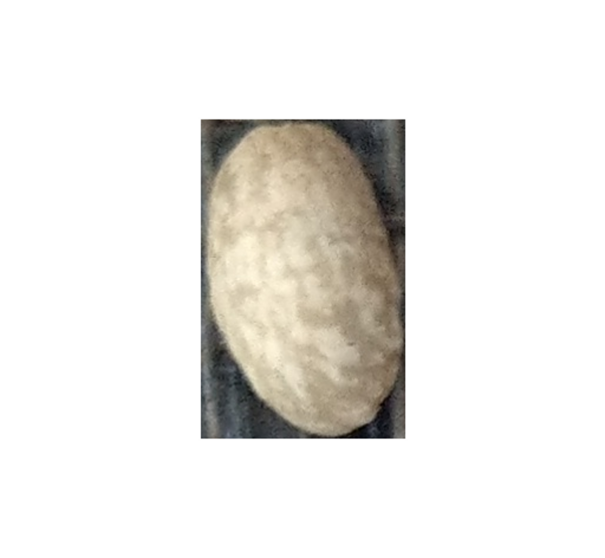

array([0.01114355, 0.843381  , 0.07770904], dtype=float32)

['value.y.UnlabelledBean']

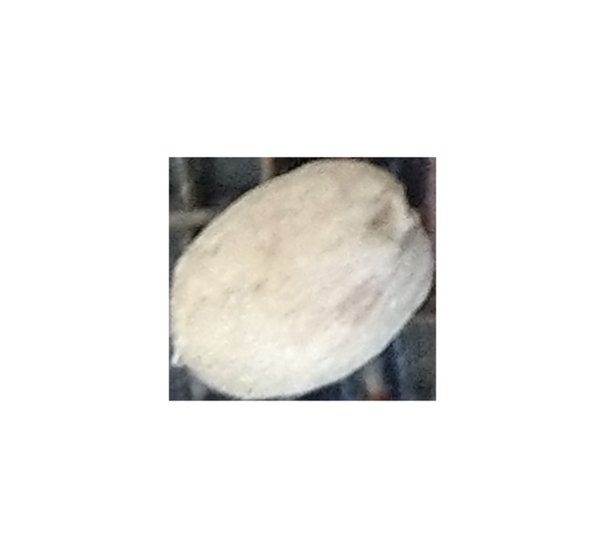

array([0.01006772, 0.23571992, 0.6547813 ], dtype=float32)

['value.y.belongsToBad']

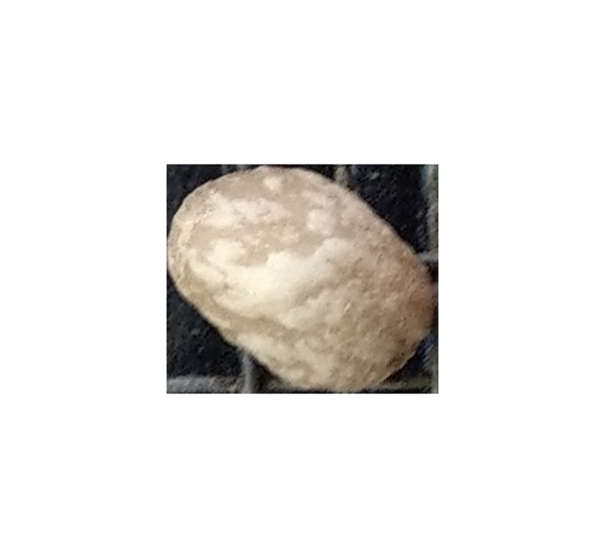

array([0.0604011 , 0.14694875, 0.78612405], dtype=float32)

['value.y.belongsToBad']

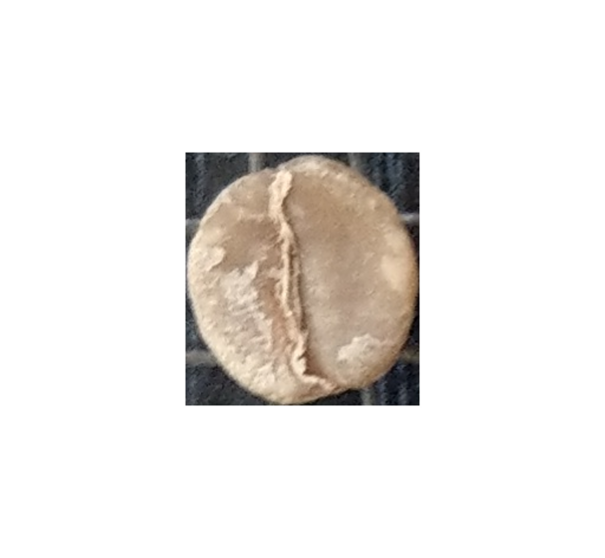

array([0.01483557, 0.08108637, 0.93238765], dtype=float32)

['value.y.belongsToBad']

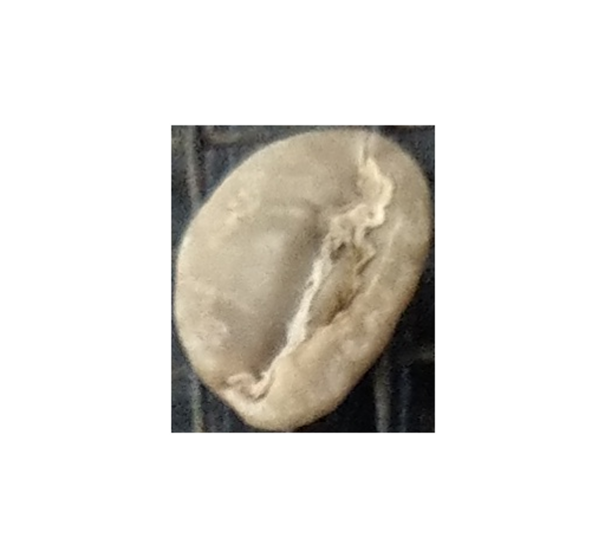

array([0.01752406, 0.44966054, 0.5369999 ], dtype=float32)

['value.y.belongsToBad']

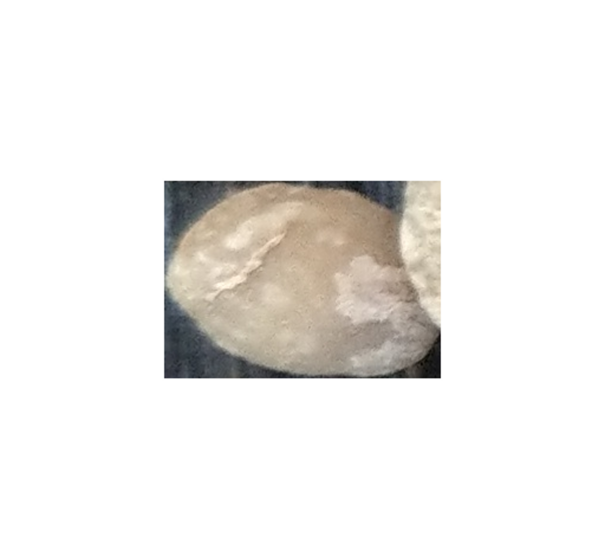

array([1.5393054e-08, 9.7161913e-01, 1.5462703e-01], dtype=float32)

['value.y.UnlabelledBean']

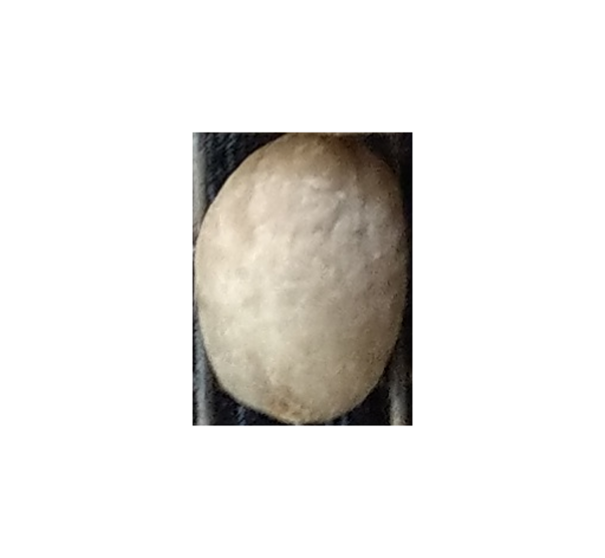

array([3.4338169e-05, 8.6960769e-01, 2.0952855e-01], dtype=float32)

['value.y.UnlabelledBean']

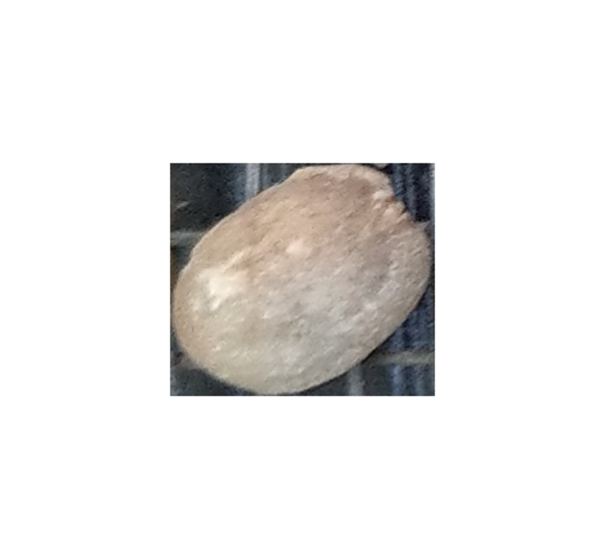

array([0.34530553, 0.20336501, 0.42917395], dtype=float32)

[]

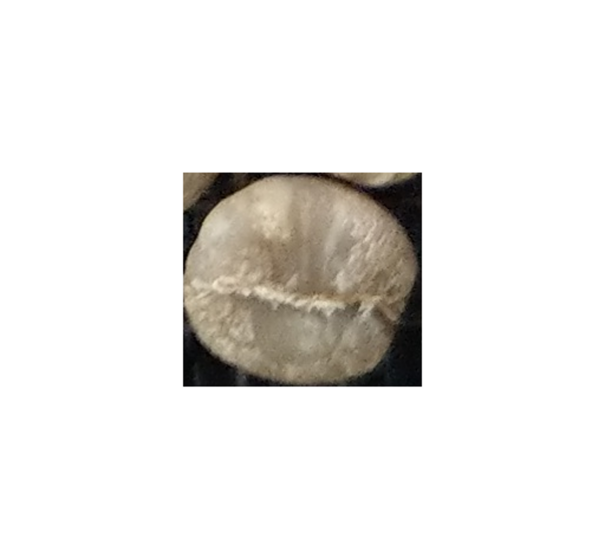

array([0.00142019, 0.63479215, 0.624369  ], dtype=float32)

['value.y.UnlabelledBean', 'value.y.belongsToBad']

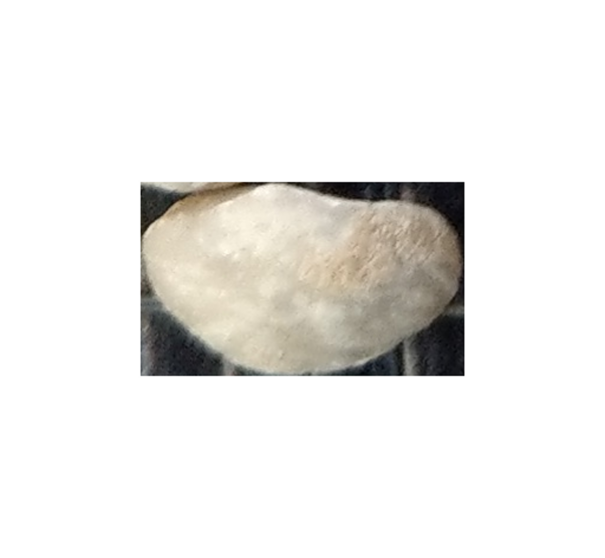

array([1.8958596e-04, 3.7234414e-01, 8.1896424e-01], dtype=float32)

['value.y.belongsToBad']

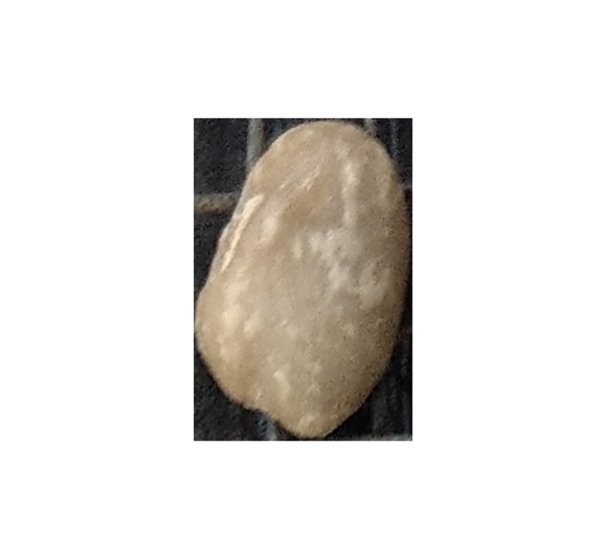

array([0.8908756 , 0.15400665, 0.28860012], dtype=float32)

['value.y.Good']

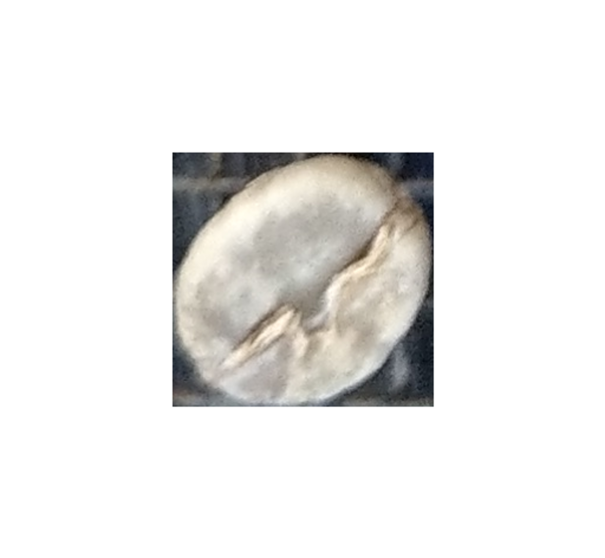

array([0.91873306, 0.16958188, 0.25623125], dtype=float32)

['value.y.Good']

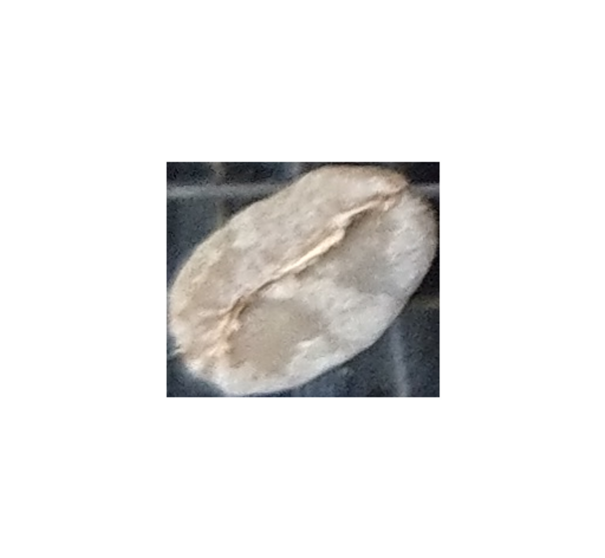

array([0.0023514 , 0.05602941, 0.9764356 ], dtype=float32)

['value.y.belongsToBad']

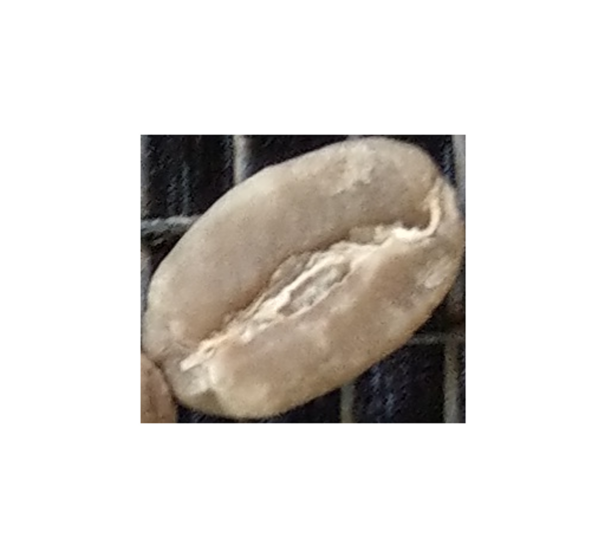

array([0.0157369 , 0.05850185, 0.9296744 ], dtype=float32)

['value.y.belongsToBad']

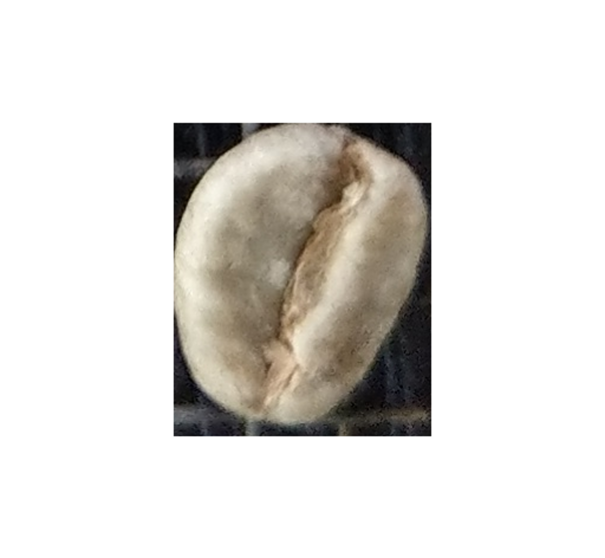

array([0.00211022, 0.40686148, 0.564941  ], dtype=float32)

['value.y.belongsToBad']

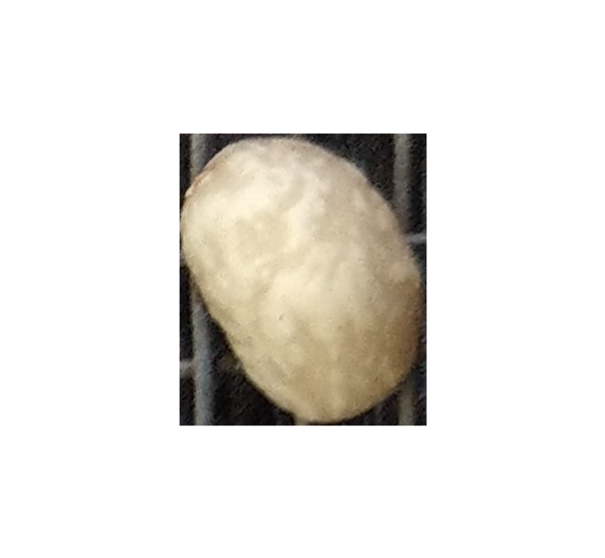

array([0.4751373 , 0.18066102, 0.5200752 ], dtype=float32)

['value.y.belongsToBad']

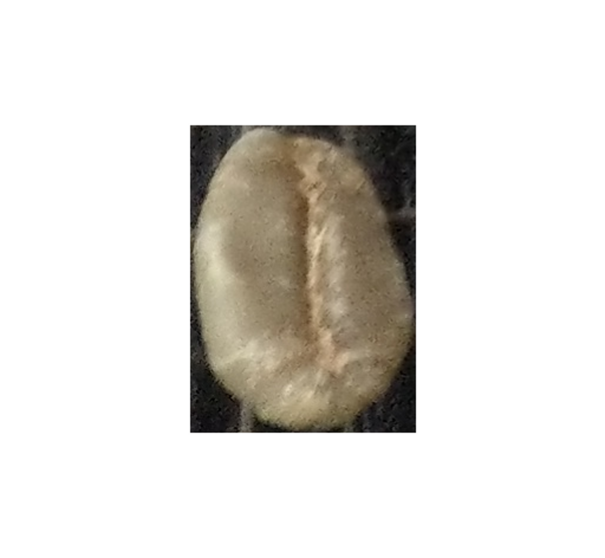

array([0.91455406, 0.1235808 , 0.46550682], dtype=float32)

['value.y.Good']

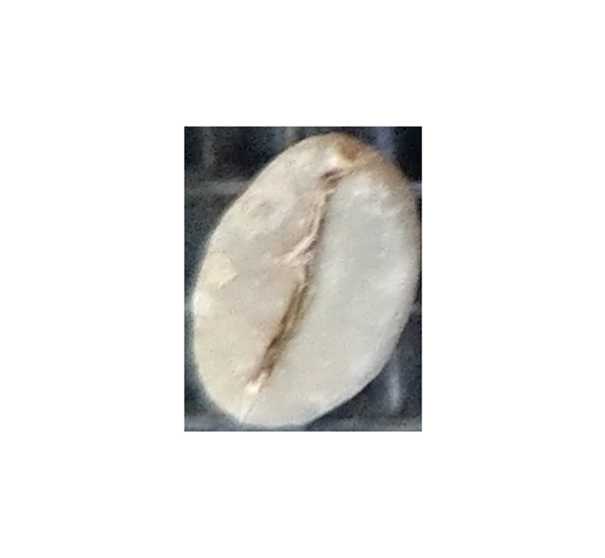

array([0.19509628, 0.17377262, 0.6782518 ], dtype=float32)

['value.y.belongsToBad']

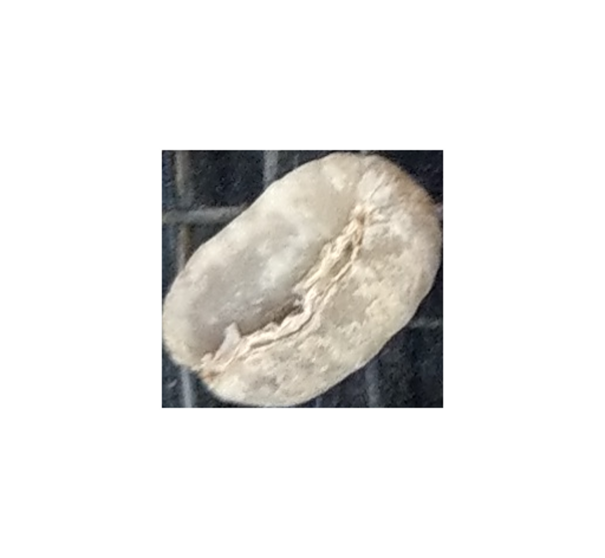

array([0.2929437, 0.1410682, 0.6871197], dtype=float32)

['value.y.belongsToBad']

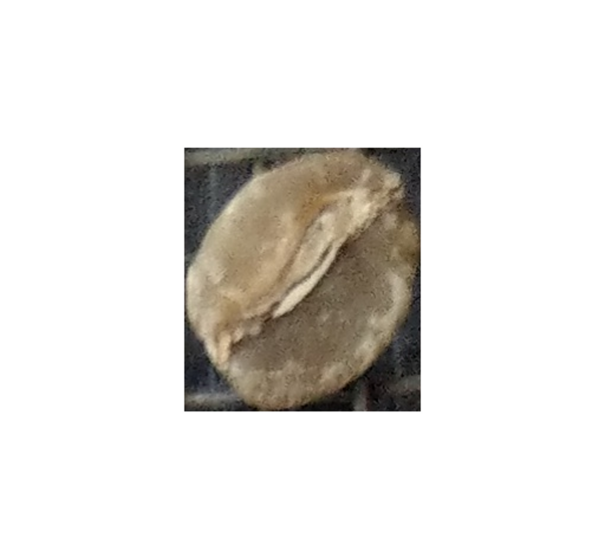

array([0.42695314, 0.12977801, 0.49843705], dtype=float32)

[]

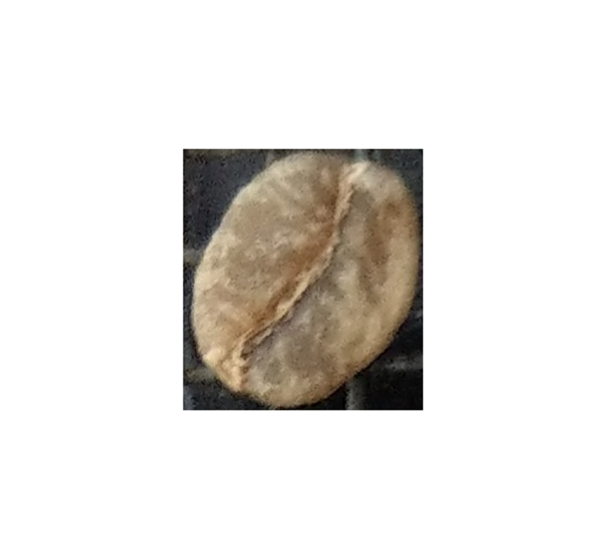

array([0.24295904, 0.15661642, 0.6395555 ], dtype=float32)

['value.y.belongsToBad']

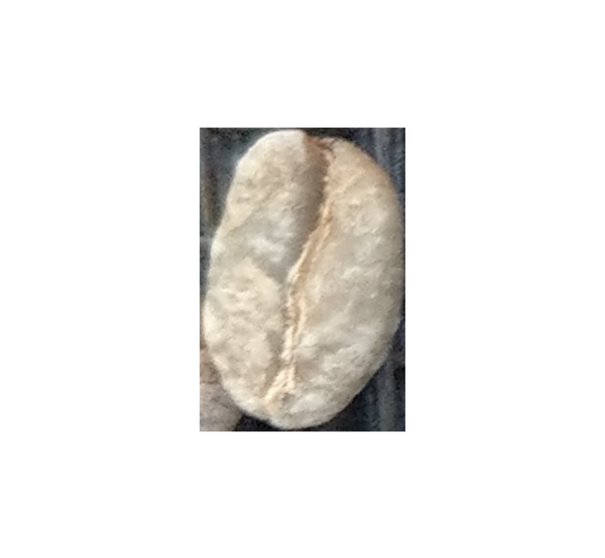

array([0.20249836, 0.09344938, 0.6729174 ], dtype=float32)

['value.y.belongsToBad']

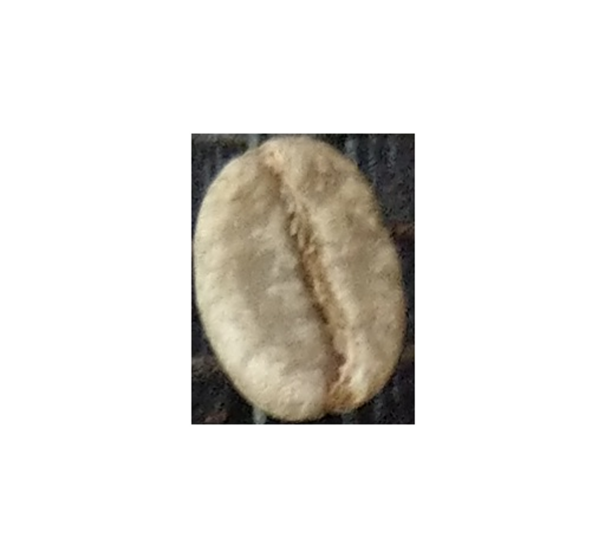

array([0.7772494 , 0.20232716, 0.3276397 ], dtype=float32)

['value.y.Good']

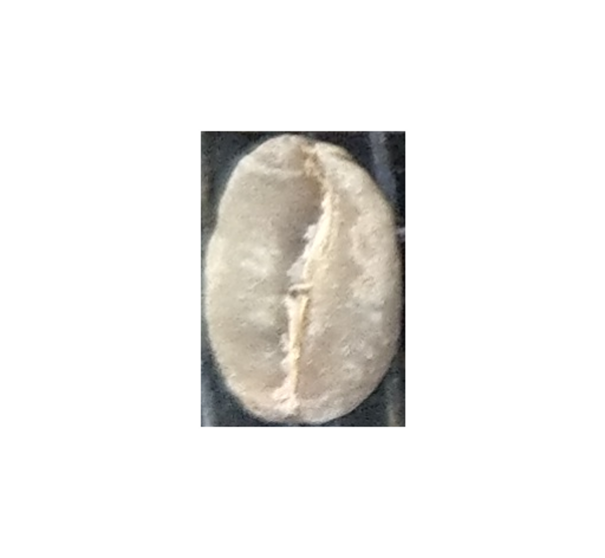

array([0.05939542, 0.19475399, 0.7351408 ], dtype=float32)

['value.y.belongsToBad']

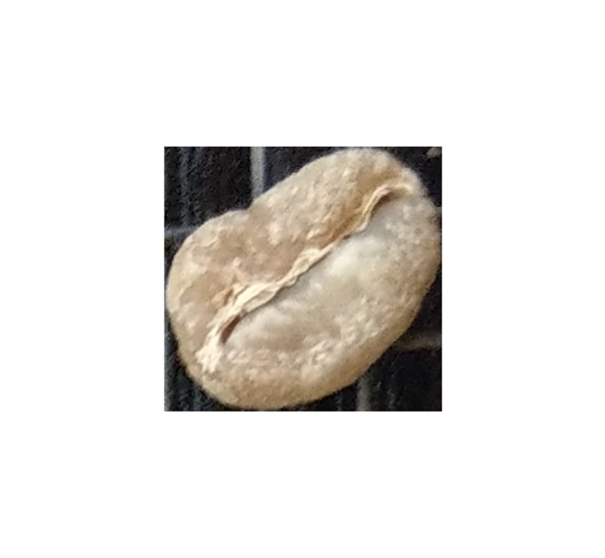

array([0.00591581, 0.145234  , 0.89787894], dtype=float32)

['value.y.belongsToBad']

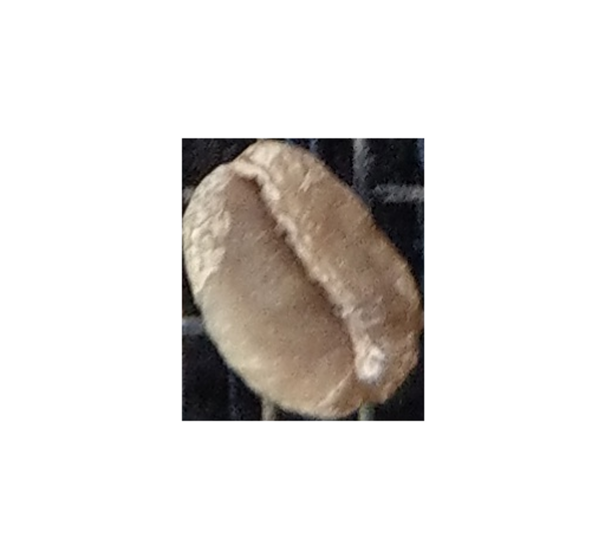

array([0.34035823, 0.10822186, 0.59088284], dtype=float32)

['value.y.belongsToBad']

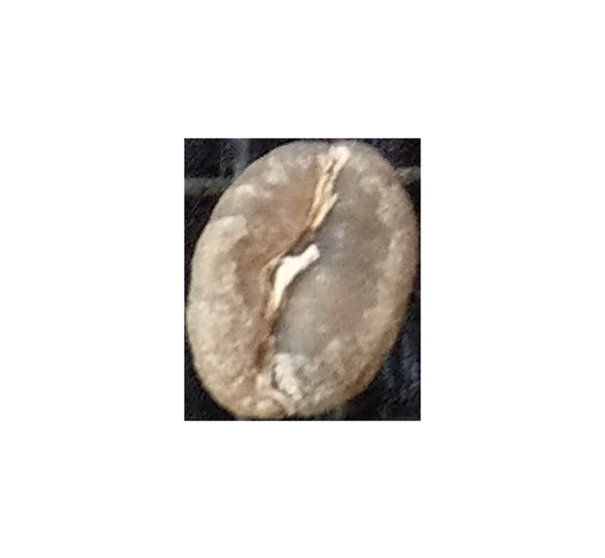

array([0.08305538, 0.3093354 , 0.5063361 ], dtype=float32)

['value.y.belongsToBad']

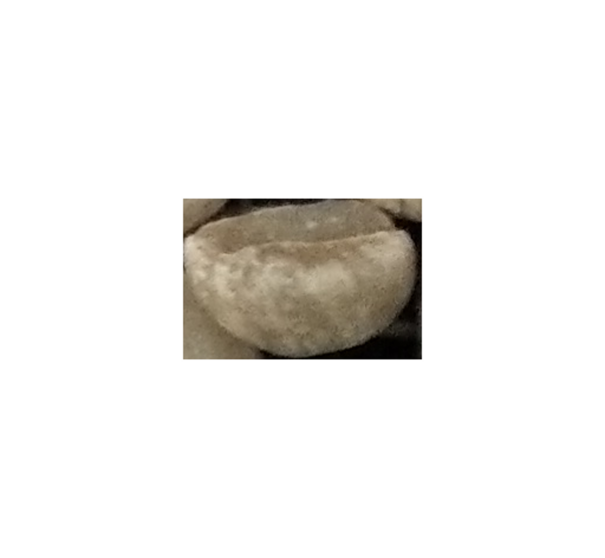

array([3.6826724e-04, 7.1222591e-01, 3.5563606e-01], dtype=float32)

['value.y.UnlabelledBean']

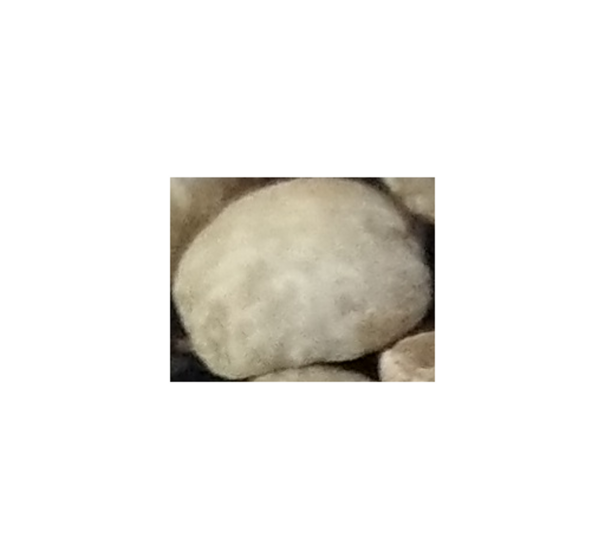

array([0.00537866, 0.09603178, 0.9363218 ], dtype=float32)

['value.y.belongsToBad']

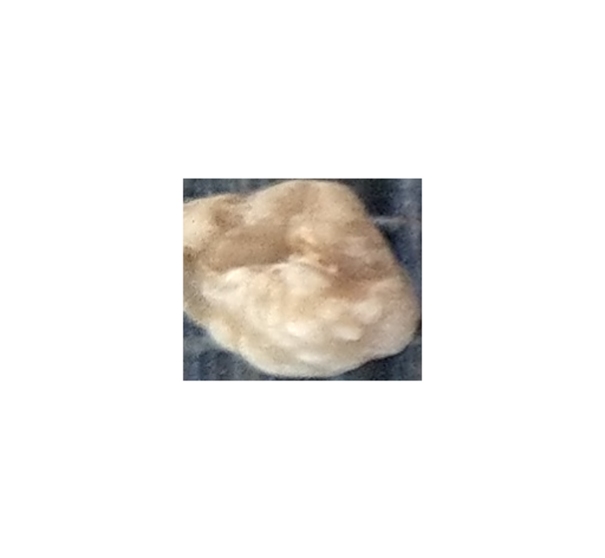

array([1.9488057e-04, 1.6724256e-01, 7.9300332e-01], dtype=float32)

['value.y.belongsToBad']

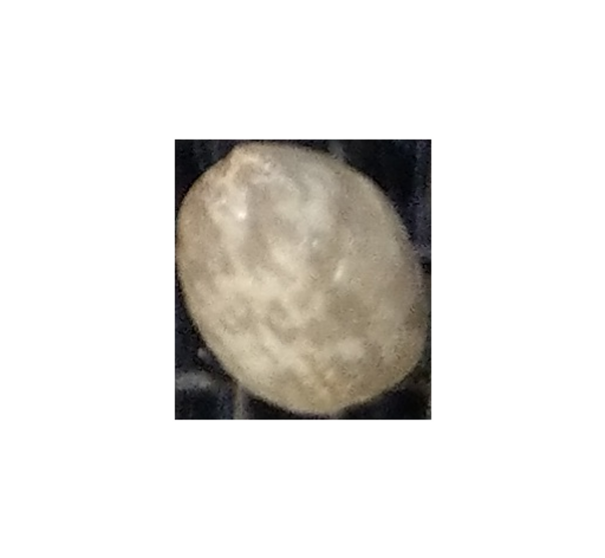

array([2.0883772e-07, 9.9433267e-01, 3.5265304e-02], dtype=float32)

['value.y.UnlabelledBean']

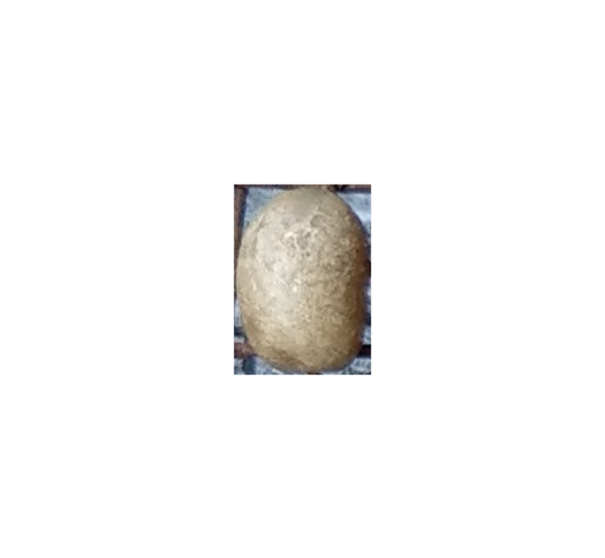

array([0.99508864, 0.16798978, 0.24807875], dtype=float32)

['value.y.Good']

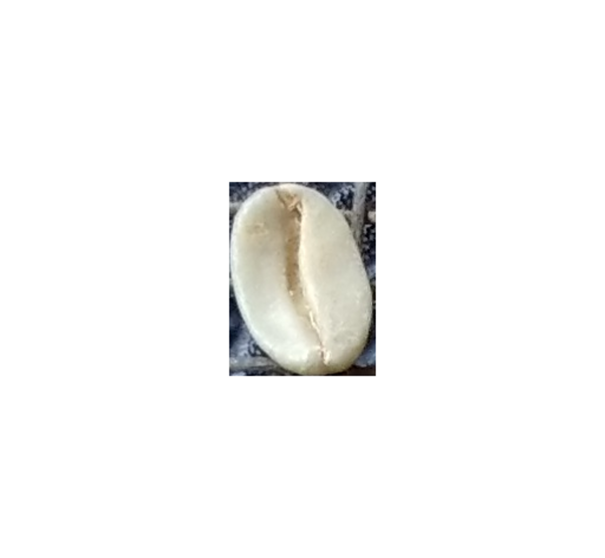

array([2.7016873e-05, 9.6358049e-01, 1.0082136e-01], dtype=float32)

['value.y.UnlabelledBean']

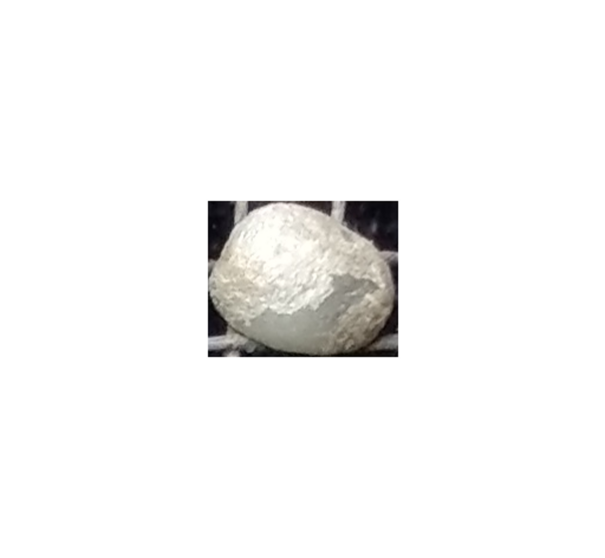

In [59]:
for imgN,img in enumerate(X_all):
    check_i = 100
    if imgN<=check_i or imgN>check_i+100: continue
    img = X_all[imgN].compute()
    reshapedImg = img.reshape((1,)+img.shape)
    predResult = clsModel.predict(reshapedImg).reshape(-1,)
    matchResults = copy.deepcopy(predResult)
    matchResults = [badCondensedTrainlabels[key] for key,matchResult in enumerate(matchResults) if matchResult>=0.5]
    display(predResult)
    display(matchResults)
    commonsettings.imShow(img, cvtColor=False)
    #break

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]